In [1]:
import numpy as np
import tifffile as tf
import os
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
# label
stim = np.array([3,1,2,3,2,1,3,1,2,1,2,3,1,2,3,2,3,1,3,2,1,2,3,1,2,3,1,2,1,3,2,3,1,2,3,1,3,1,2,3,1,2,3,2,1,2,1,3,2,1,3,1,2,3,1,2,3,2,1,3,1,2,3,2,1,3,1,3,2,3,2,1,3,2,1,3,1,2,3,2,1,3,1,2,3,2,1,2,3,1,
                 3,1,2,3,1,2,3,2,1,2,3,1,2,1,3,2,1,3,1,3,2,3,1,2,1,2,3,2,3,1,2,3,1,3,2,1,2,3,1,2,1,3,1,2,3,2,3,1,2,1,3,1,3,2,3,1,2,1,2,3,2,1,3,1,2,3,2,3,1,3,1,2,1,3,2,1,3,2,3,1,2,3,2,1,2,1,3,1,2,3])


In [2]:
def projection_3d(data,x_scale,y_scale,z_scale,space,colormapname,caxis,projection_type,ifcolorbar,ifsave,savepath):
    # projection_type: 0-max;1-mean
    if projection_type == 0:
        data_px = np.max(data,0)
        data_py = np.max(data,1)
        data_pz = np.max(data,2)
    else:
        data_px = np.mean(data,0)
        data_py = np.mean(data,1)
        data_pz = np.mean(data,2)
    # plot
    x_scale = int(x_scale)
    y_scale = int(y_scale)
    z_scale = int(z_scale)
    plt.figure(figsize=(6,6))
    grid = plt.GridSpec(y_scale + z_scale + space, x_scale + z_scale + space)
    plt.subplot(grid[0:y_scale,0:x_scale])
    if len(caxis)>0:
        plt.imshow(data_pz,cmap = colormapname,vmin = caxis[0],vmax = caxis[1],aspect = 'auto')
    else:
        plt.imshow(data_pz,cmap = colormapname,aspect = 'auto')
    plt.xticks([]),plt.yticks([])
    plt.subplot(grid[0:y_scale,x_scale+space:x_scale+z_scale+space]) # y
    if len(caxis)>0:
        plt.imshow(data_py[:,::-1],cmap = colormapname,vmin = caxis[0],vmax = caxis[1],aspect = 'auto')
    else:
        plt.imshow(data_py[:,::-1],cmap = colormapname,aspect = 'auto')
    plt.xticks([]),plt.yticks([])
    plt.subplot(grid[y_scale+space:y_scale+z_scale+space,0:x_scale]) # x
    if len(caxis)>0:
        plt.imshow(np.transpose(data_px[:,::-1]),cmap = colormapname,vmin = caxis[0],vmax = caxis[1],aspect = 'auto')
    else:
        plt.imshow(np.transpose(data_px[:,::-1]),cmap = colormapname,aspect = 'auto')
    plt.xticks([]),plt.yticks([])
    if ifcolorbar:
        plt.subplot(grid[y_scale+space:y_scale+z_scale+space,x_scale+space:x_scale+z_scale+space]) 
        if len(caxis)>0:
            plt.imshow(data_py,cmap = colormapname,vmin = caxis[0],vmax = caxis[1],aspect = 'auto')
        else:
            plt.imshow(data_py,cmap = colormapname,aspect = 'auto')
        plt.xticks([]),plt.yticks([])
        plt.colorbar()
    if ifsave:
        plt.savefig(savepath, dpi = 300)
    plt.show()
    plt.close()
def compute_auc(trace,fps = 30/13):
    auc = 0
    num_tp = len(trace)
    for i in range(num_tp-1):
        auc = auc+(trace[i]+trace[i+1])*(1/fps)/2
    return auc
def compute_auc_dff0(data,fps = 30/13):
    size_x = np.size(data,0)
    size_y = np.size(data,1)
    size_z = np.size(data,2)
    num_tp = np.size(data,3)
    num_trial = np.size(data,4)
    num_channel = np.size(data,5)
    auc = np.zeros((size_x,size_y,size_z,num_trial,num_channel))
    for i in range(num_tp-1):
        auc = auc+(data[:,:,:,i,:,:]+data[:,:,:,i+1,:,:])*(1/fps)/2
    return auc

In [3]:
## Ach
file_folder_list_1 = ['20230417-nsyb-G7f-rAch1h/fly2/data',
                        '20230420-nsyb-G7f-rAch1h/fly2/data',
                        '20230420-nsyb-G7f-rAch1h/fly3/data',
                        '20230428-nsyb-G7f-rAch1h/fly1/data',
                        '20230507-nsyb-G7f-rAch1h/fly1/data',
                        '20230510-nsyb-G7f-rAch1h/fly1/data',
                        '20230510-nsyb-G7f-rAch1h/fly2/data',
                        '20230511-nsyb-G7f-rAch1h/fly2/data',
                        '20230511-nsyb-G7f-rAch1h/fly3/data',
                        '20230515-nsyb-G7f-rAch1h/fly1/data']
# ## 5HT
# file_folder_list_1 = ['20230429-nsyb-G7f-r5HT1.0/fly1/data',
#                         '20230506-nsyb-G7f-r5HT1.0/fly1/data',
#                         '20230513-nsyb-G7f-r5HT1.0/fly1/data',
#                         '20230513-nsyb-G7f-r5HT1.0/fly2/data',
#                         '20230516-nsyb-G7f-r5HT1.0/fly2/data',
#                         '20230516-nsyb-G7f-r5HT1.0/fly4/data',
#                         '20230517-nsyb-G7f-r5HT1.0/fly1/data',
#                         '20230601-nsyb-G7f-r5HT1.0/fly1/data',
#                         '20230601-nsyb-G7f-r5HT1.0/fly3/data',
#                         '20230603-nsyb-G7f-r5HT1.0/fly1/data']
data_path = '../../data'
result_path = '../results/nsyb-G7f-rAch1h'
file_name = ['dff0_0-20_down1_C2','dff0_0-20_down1_C3']
atlas_path = data_path
atlas_name = 'align_to_atlas/Transformed_atlas.tif'
atlas_z_range = range(13,38)
num_channel = 2
ifsave  = True
fly_selected_list = [0,1,2,3,4,5,6,7,8,9]
if ifsave:
    final_result_path = os.path.abspath(result_path + '/' + 'figures-for-revision1/ensemble_significance/rAch')
    folder = os.path.exists(final_result_path)
    if not folder:
        os.makedirs(final_result_path)

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


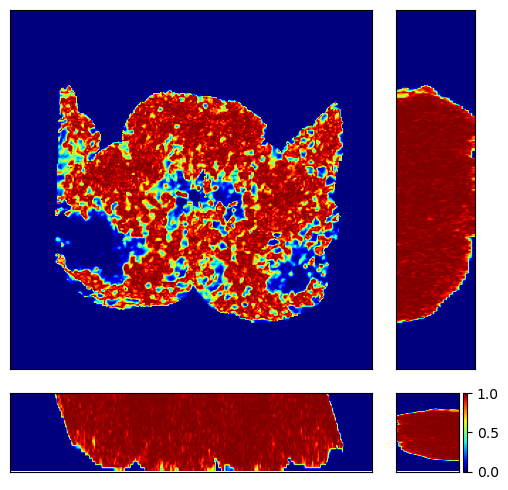

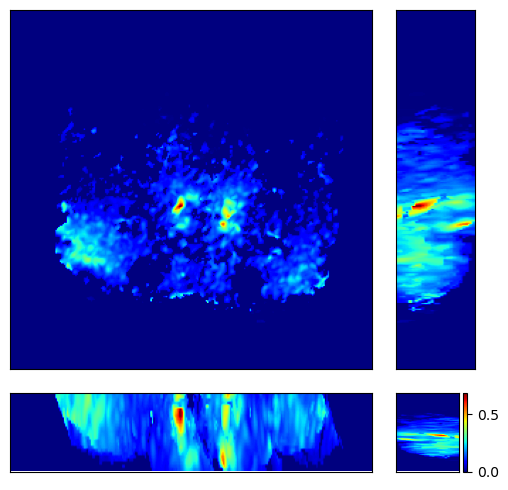

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


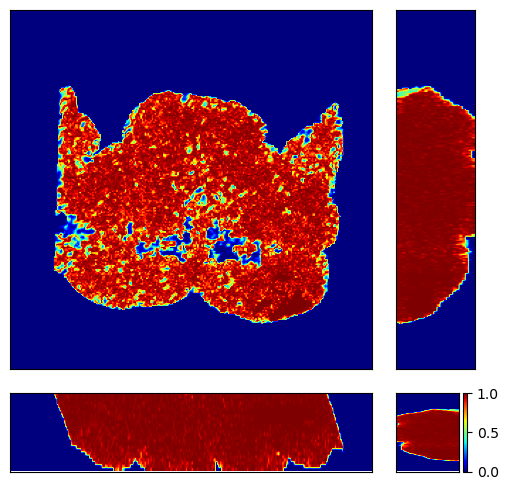

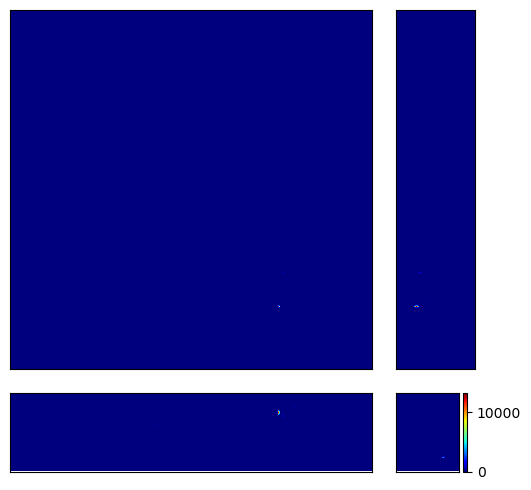

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


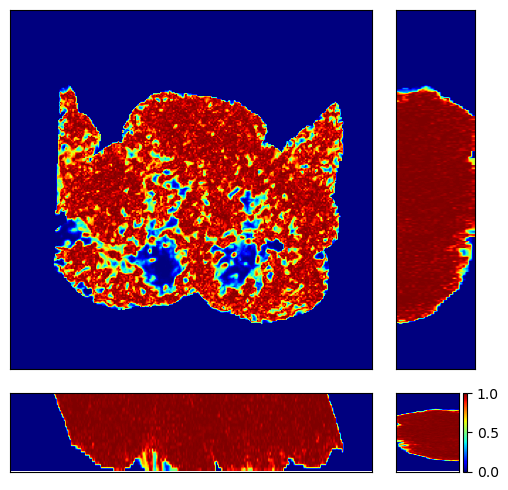

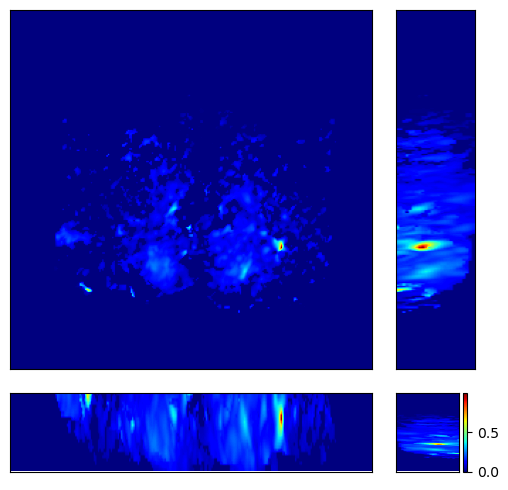

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


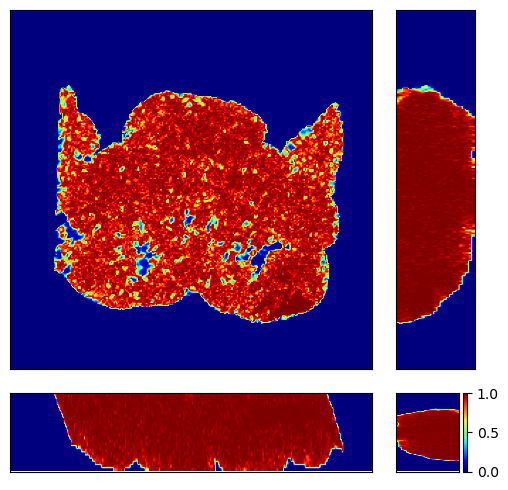

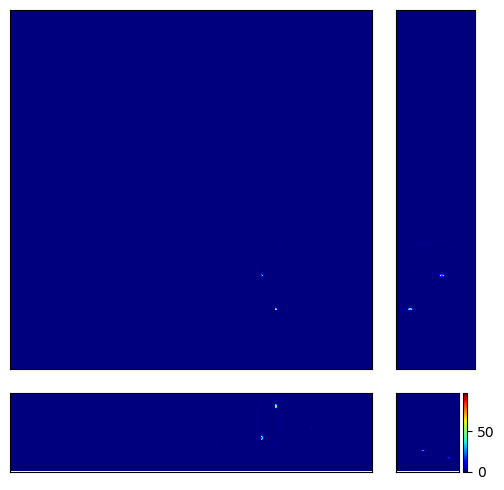

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


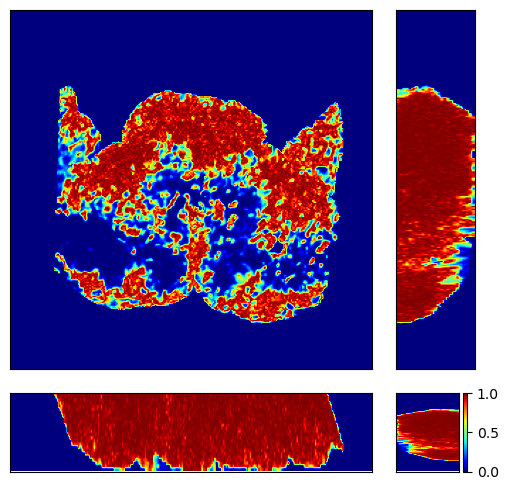

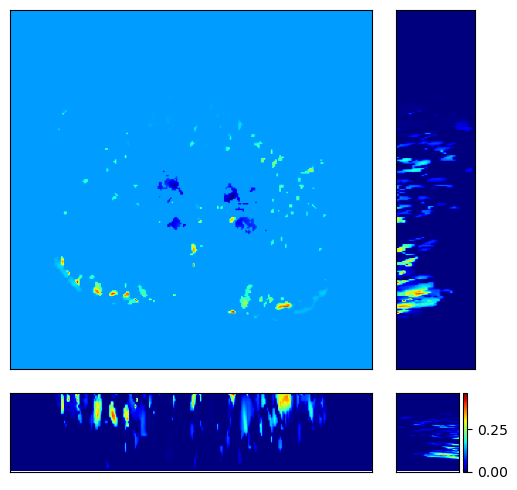

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


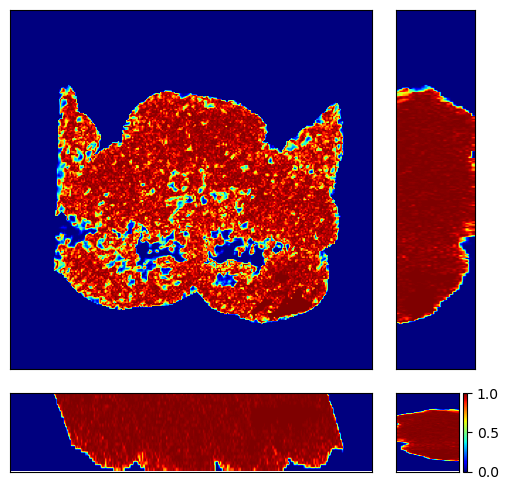

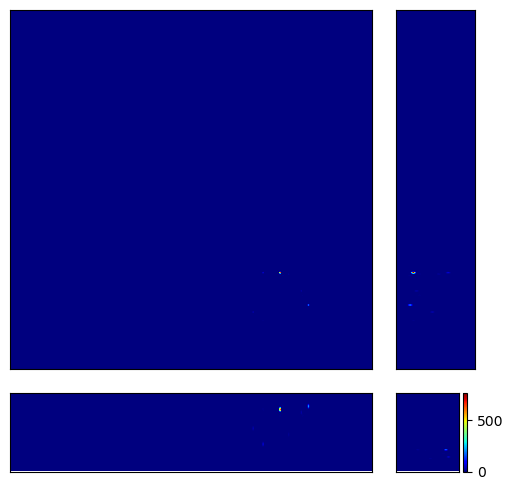

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


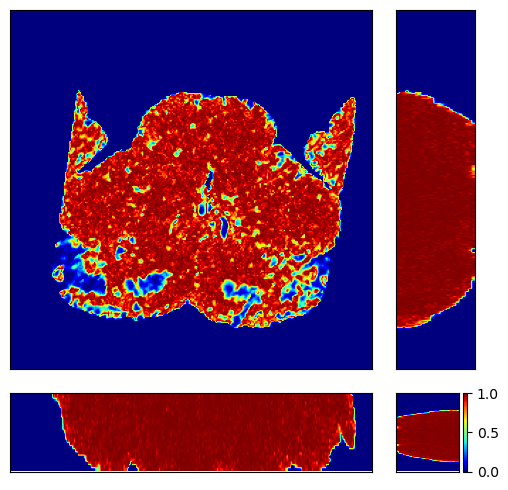

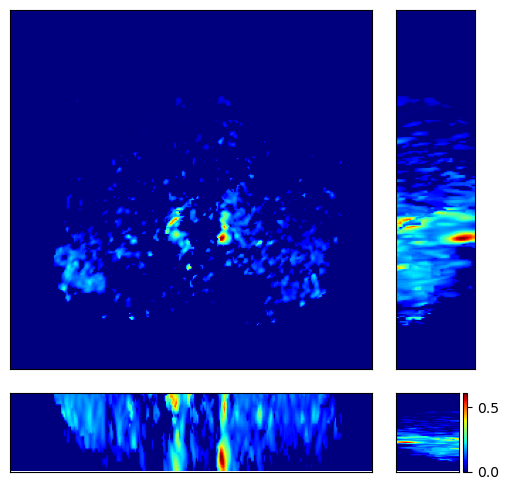

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


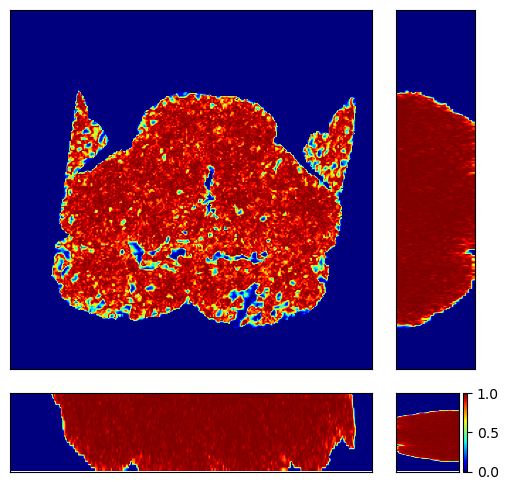

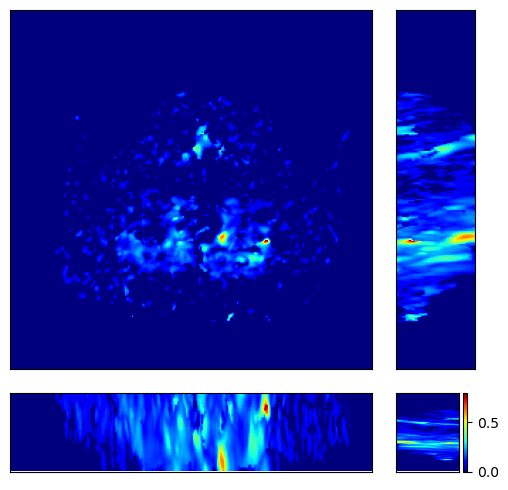

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


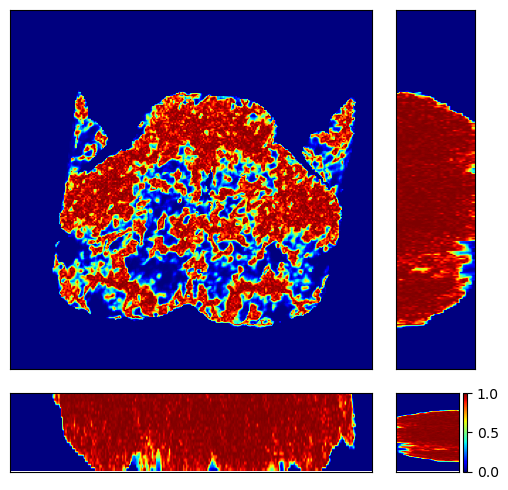

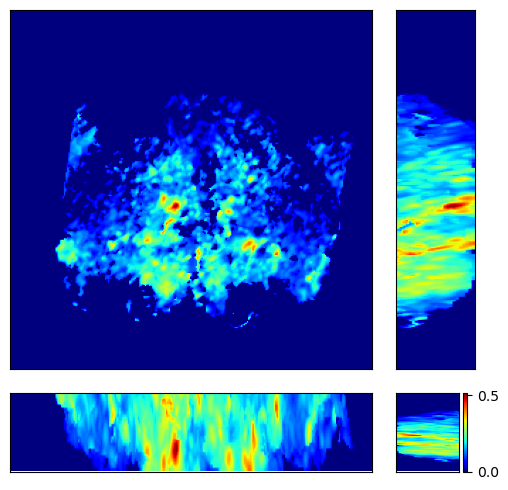

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


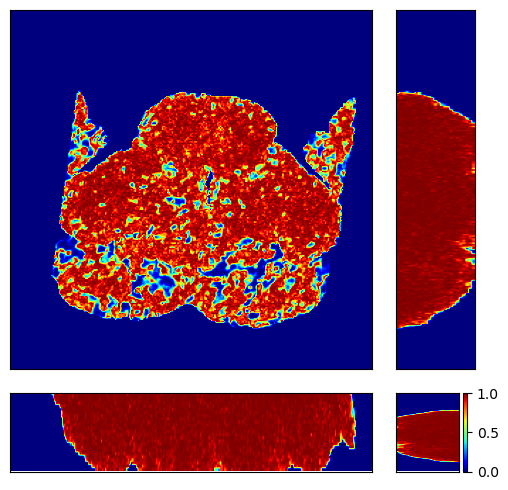

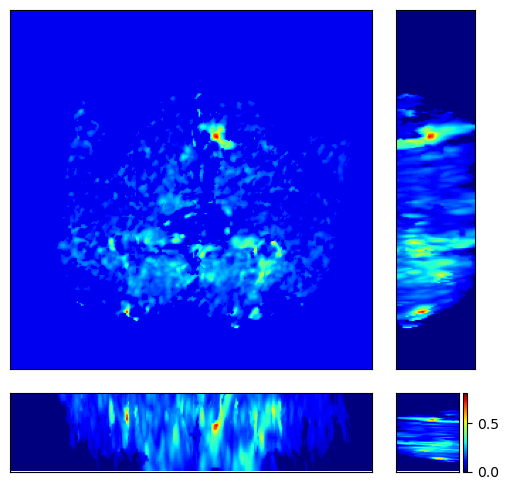

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


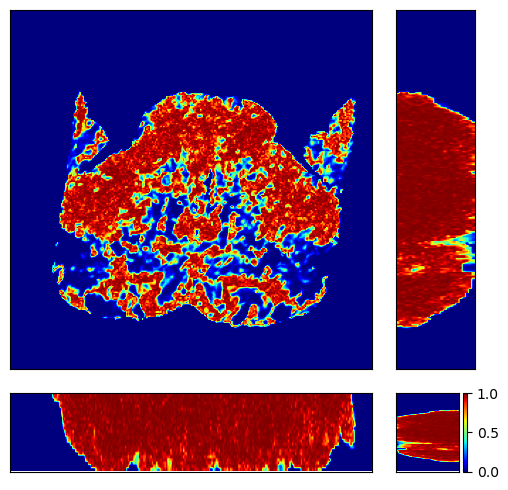

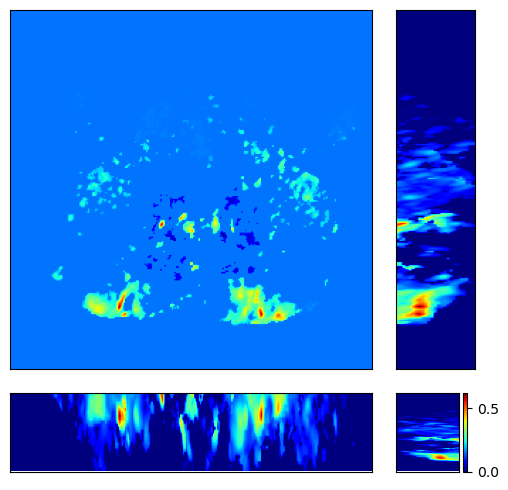

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


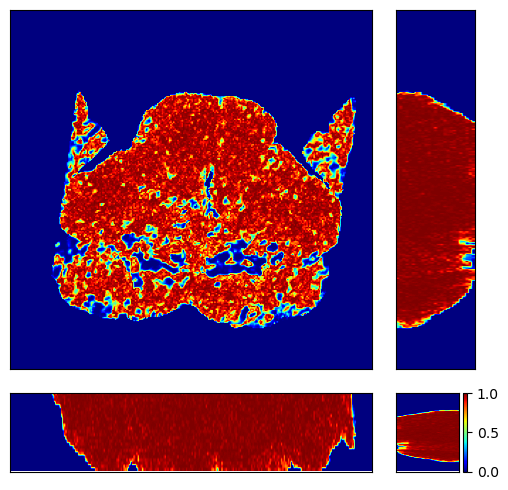

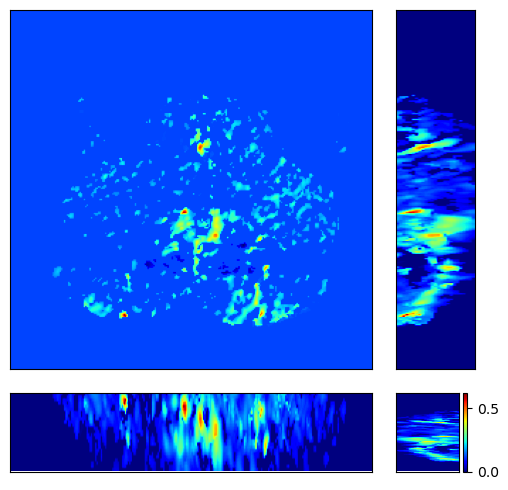

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


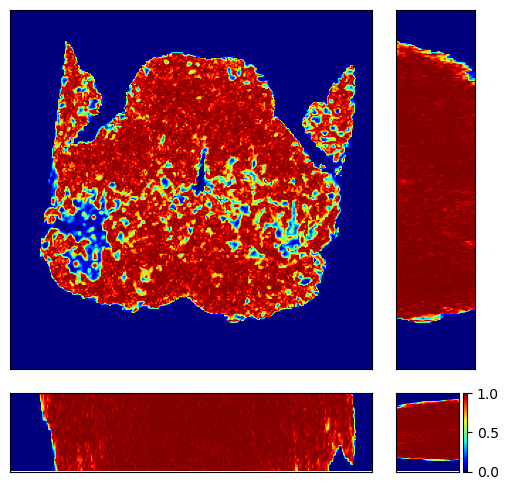

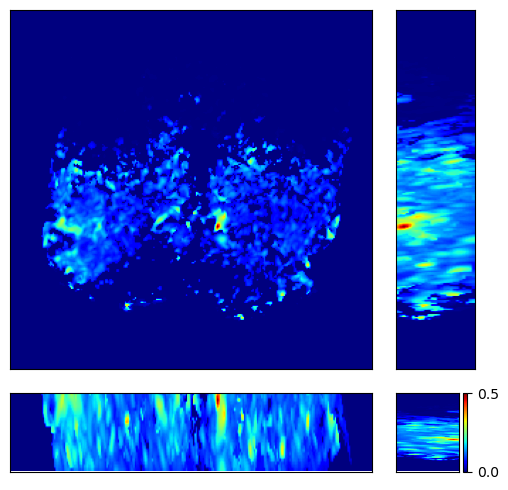

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


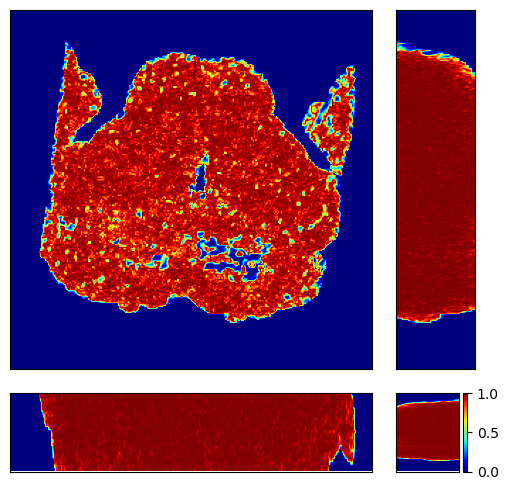

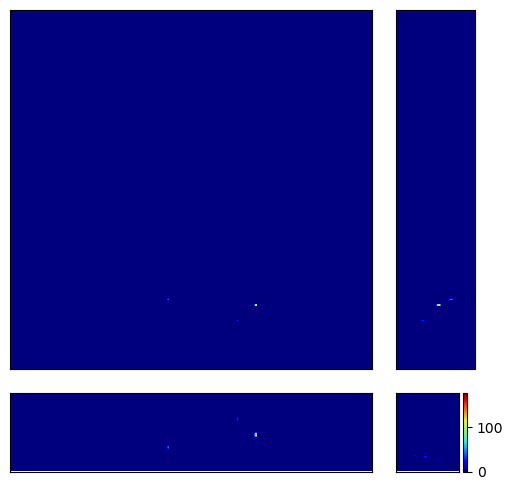

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


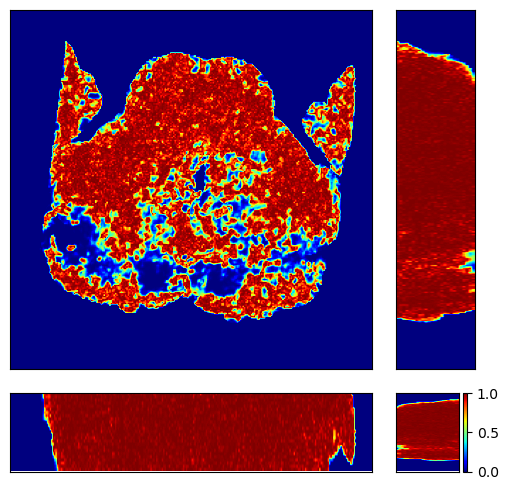

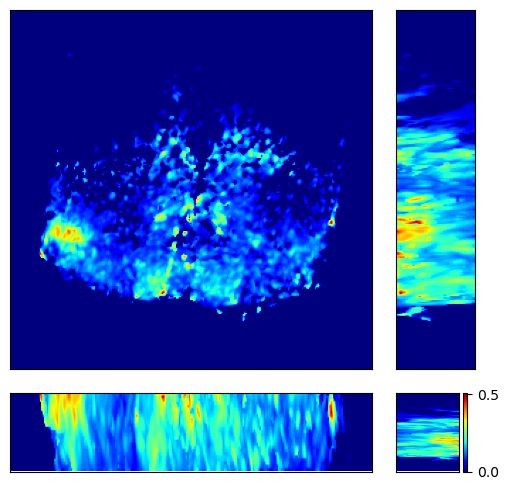

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


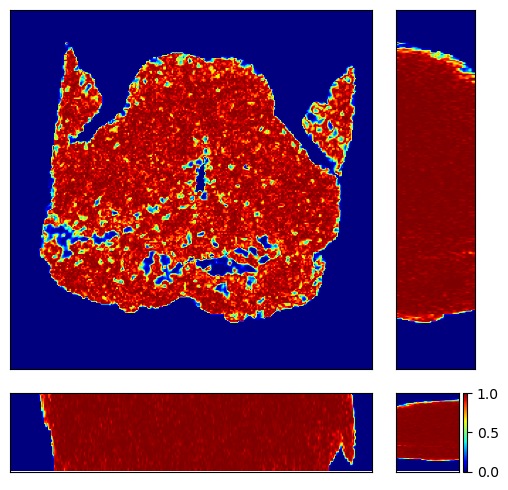

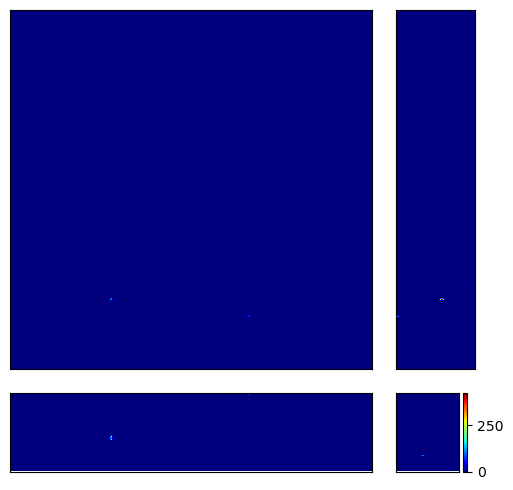

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


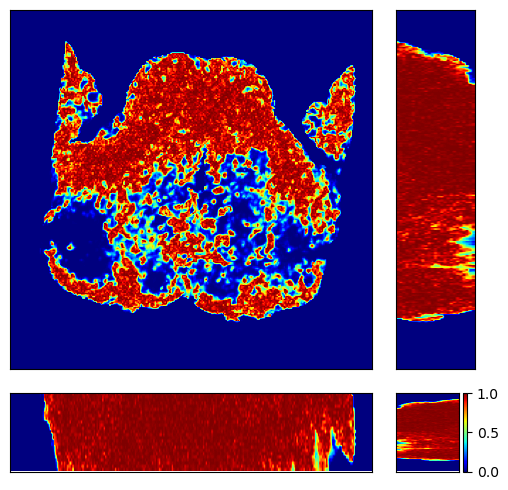

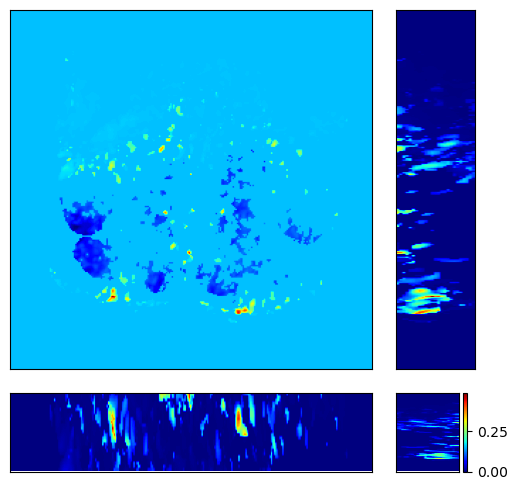

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


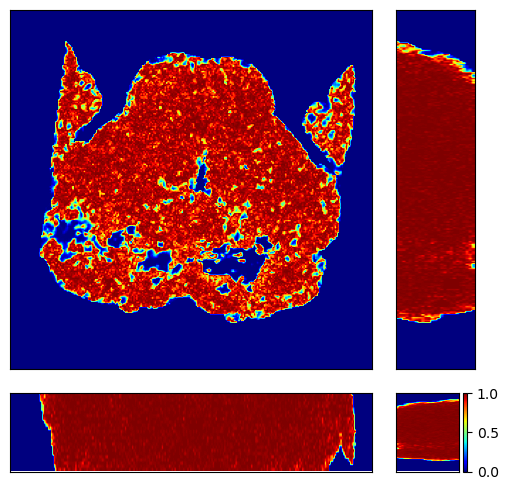

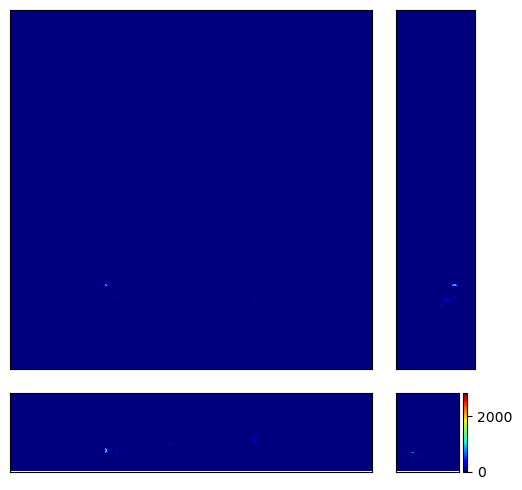

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


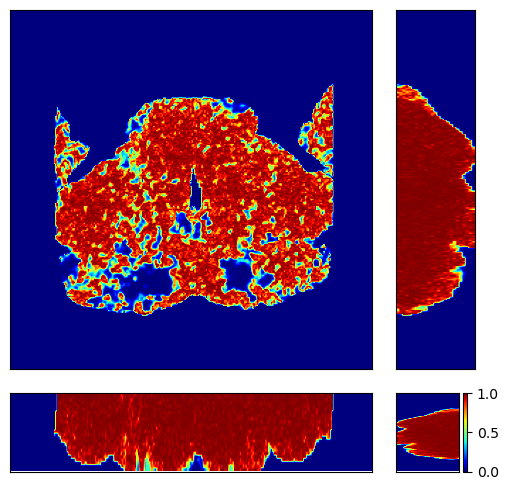

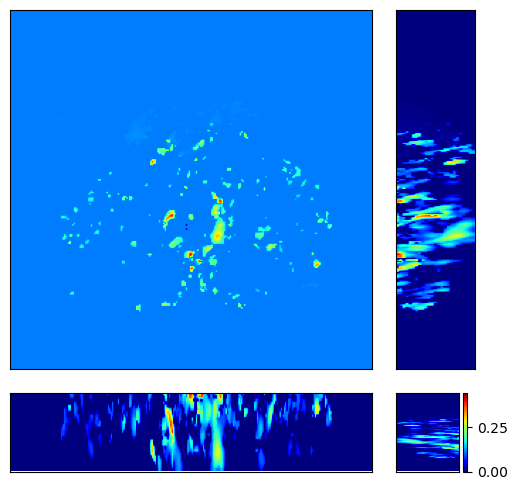

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


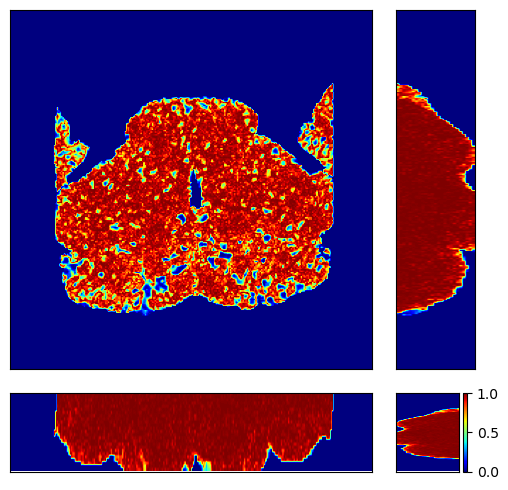

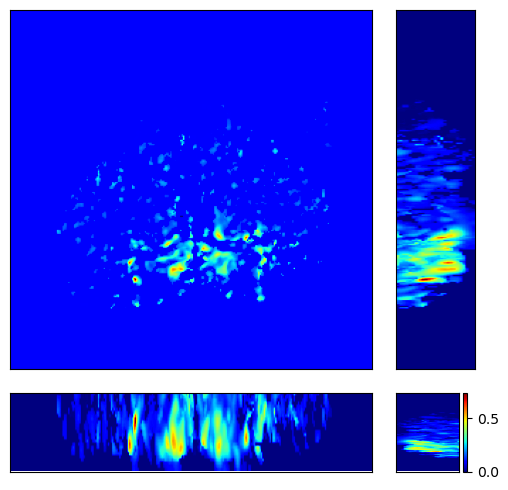

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


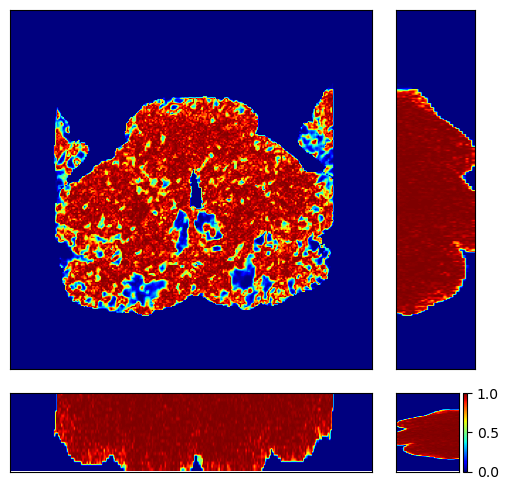

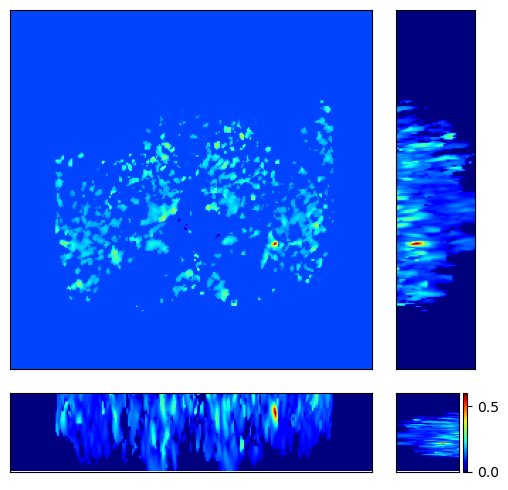

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


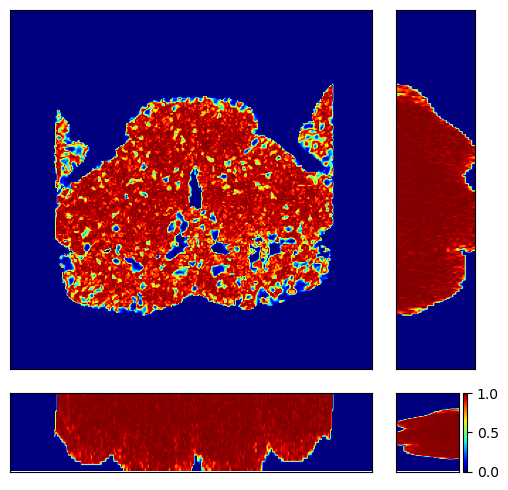

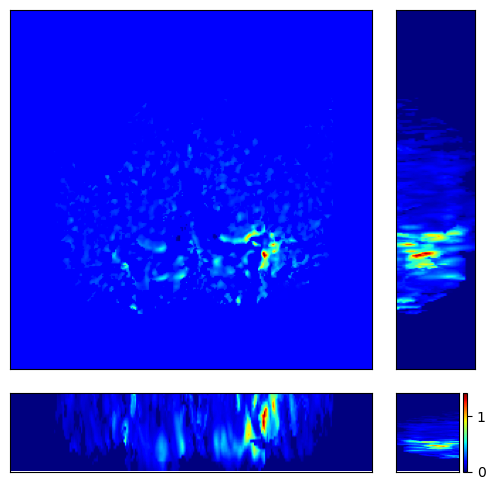

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


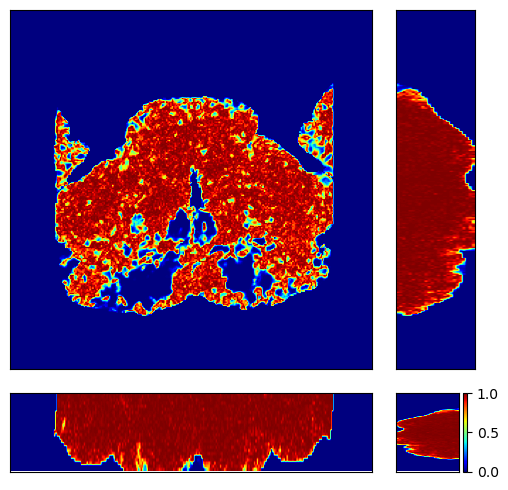

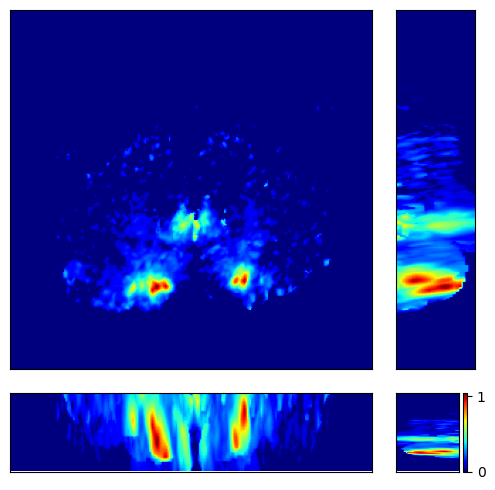

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


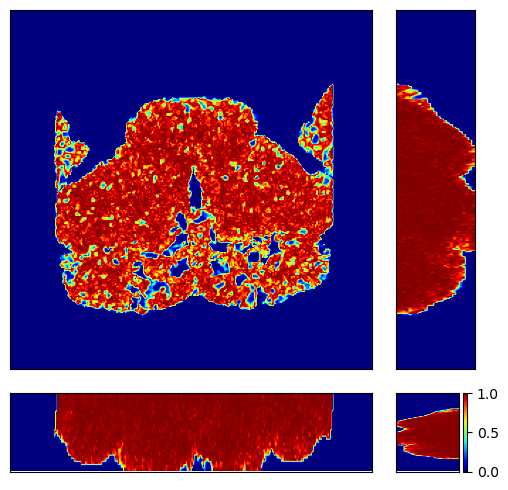

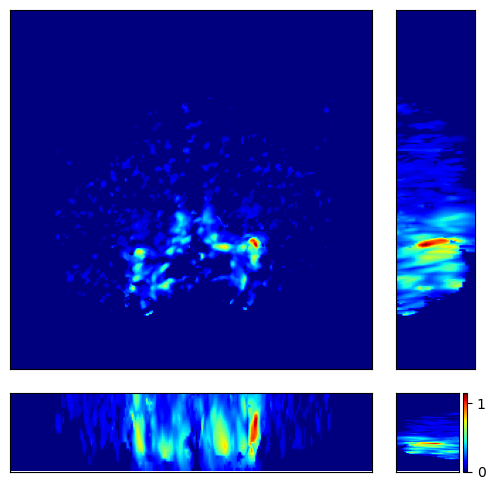

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


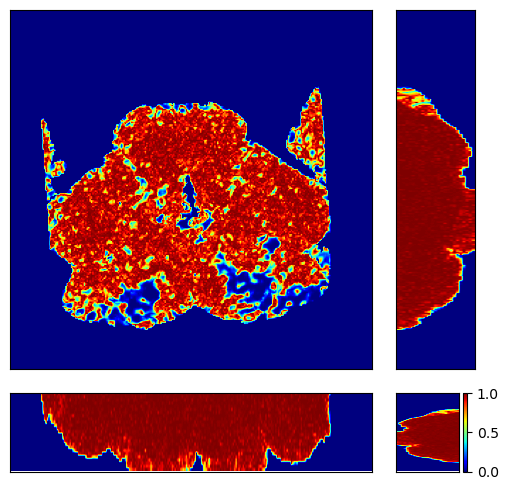

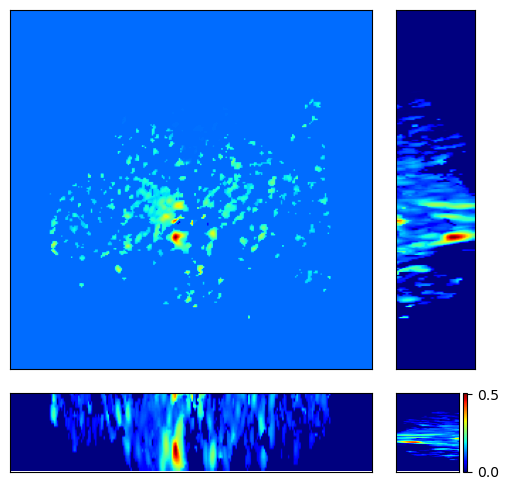

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


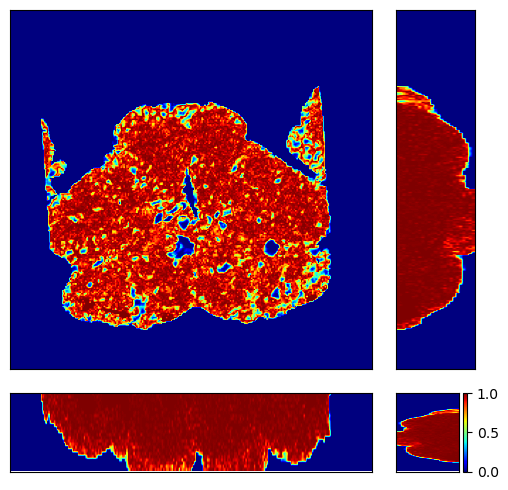

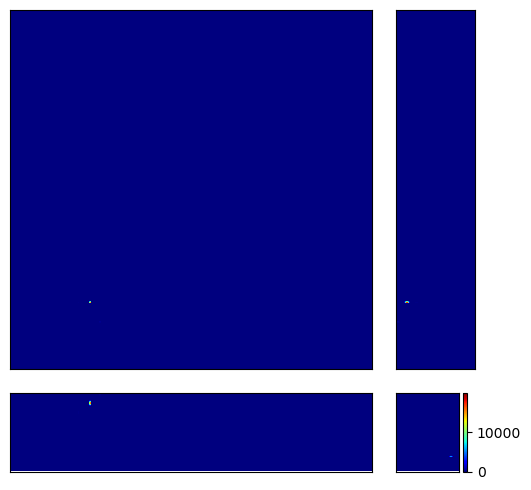

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


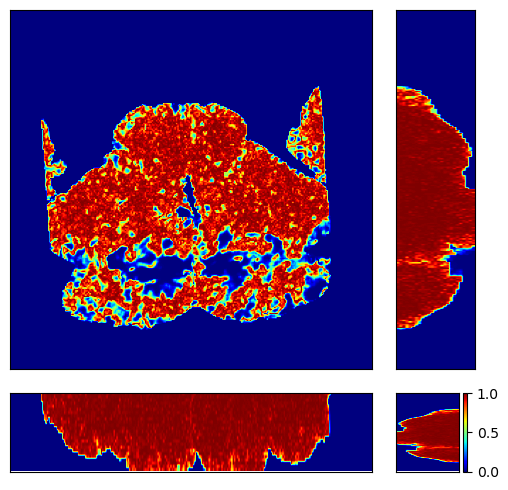

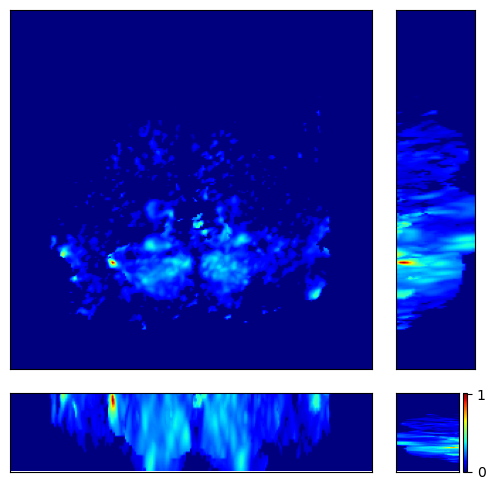

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


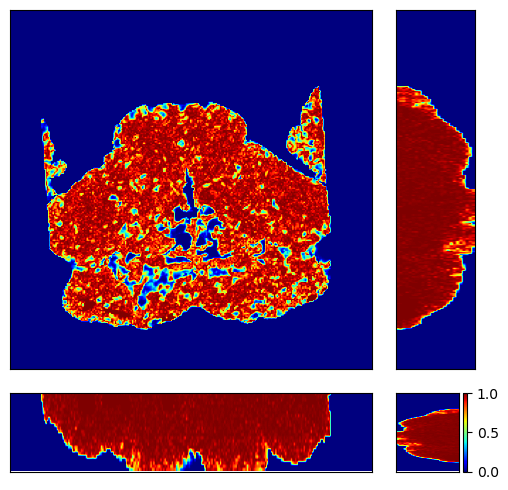

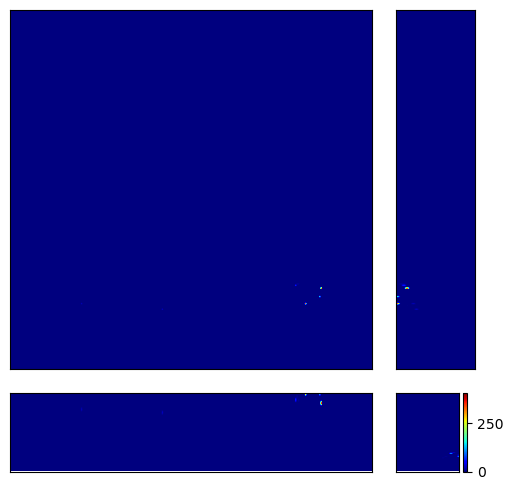

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


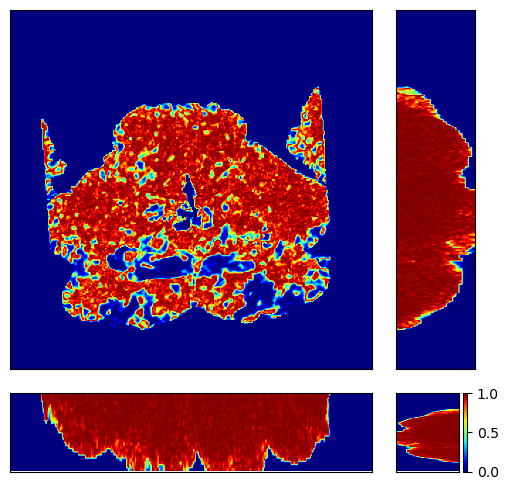

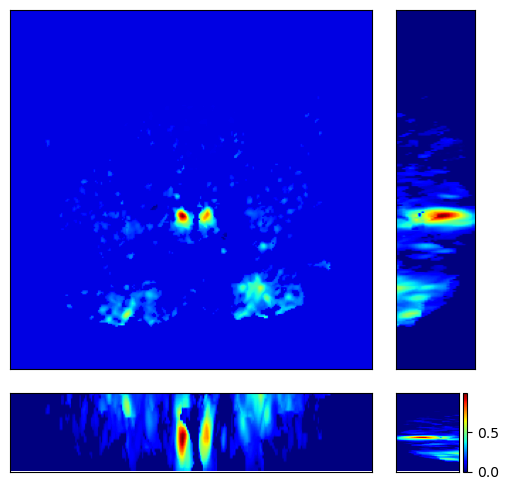

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


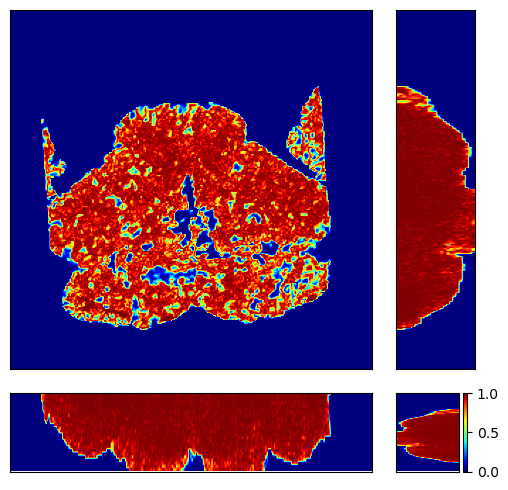

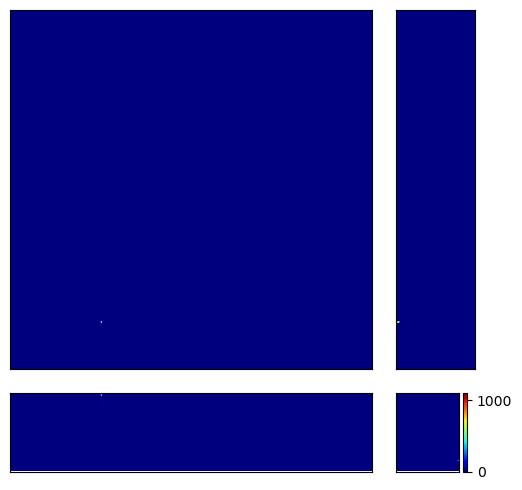

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


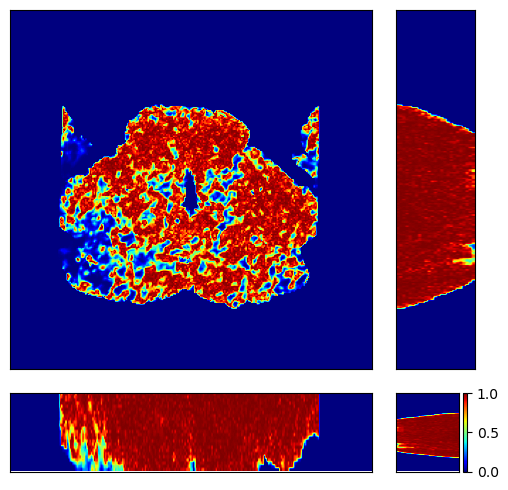

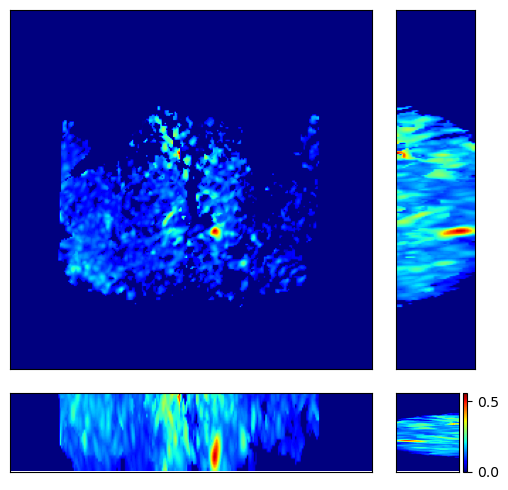

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


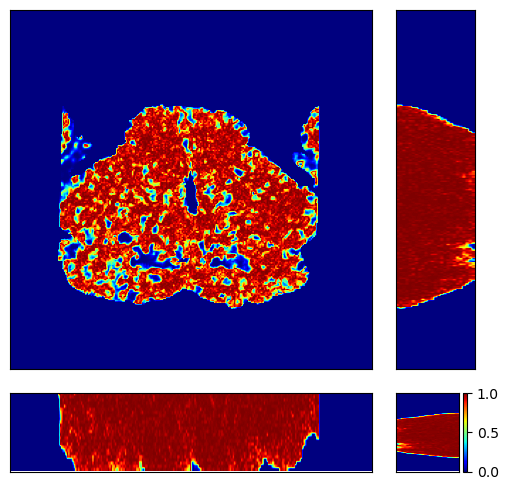

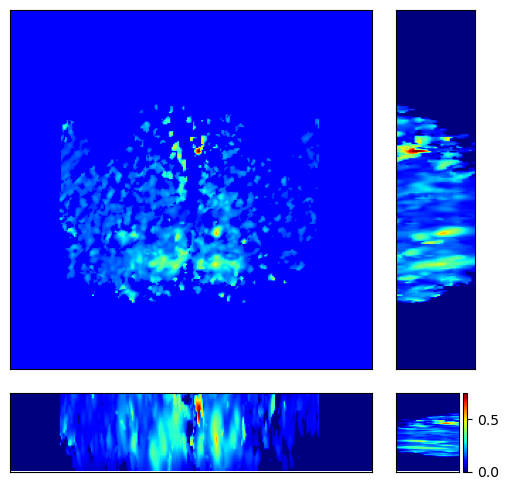

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


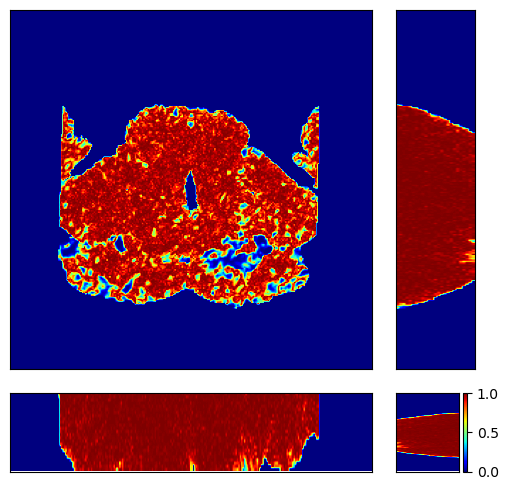

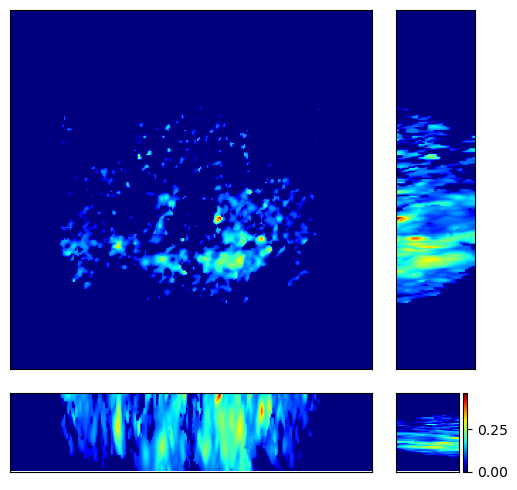

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


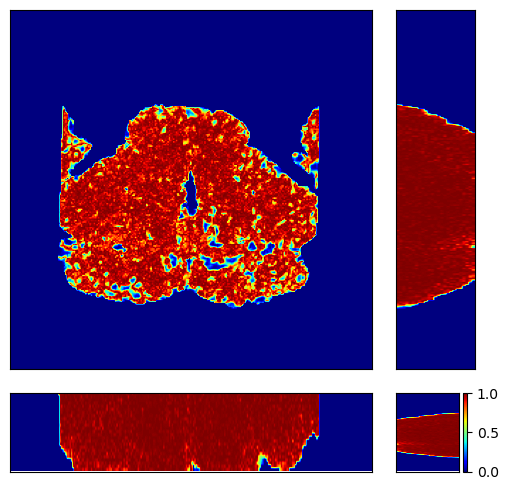

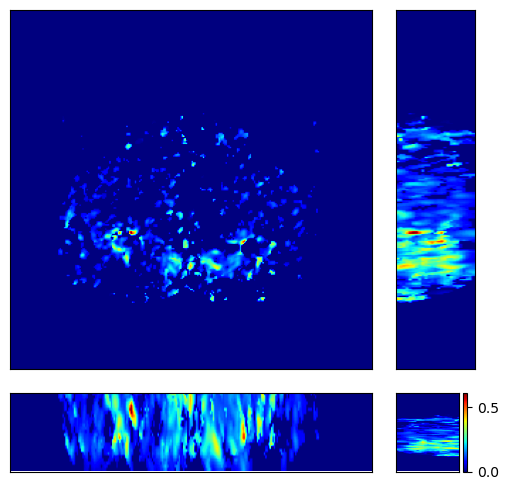

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


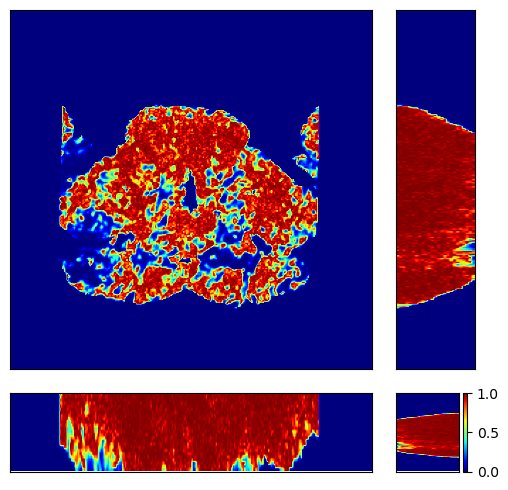

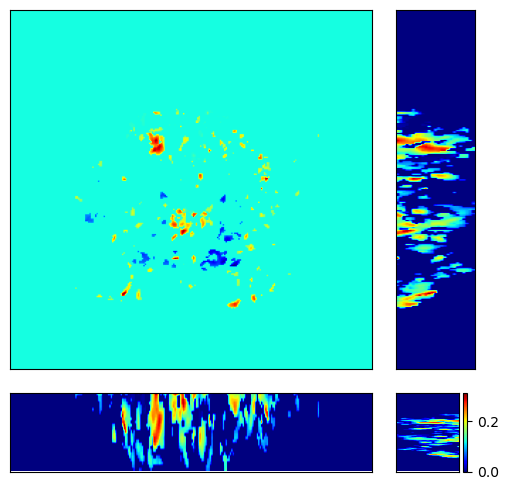

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


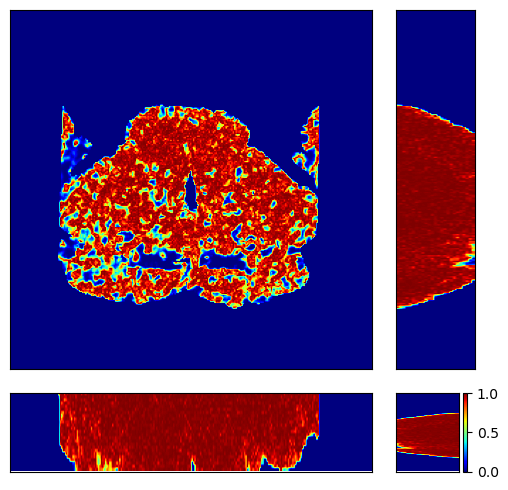

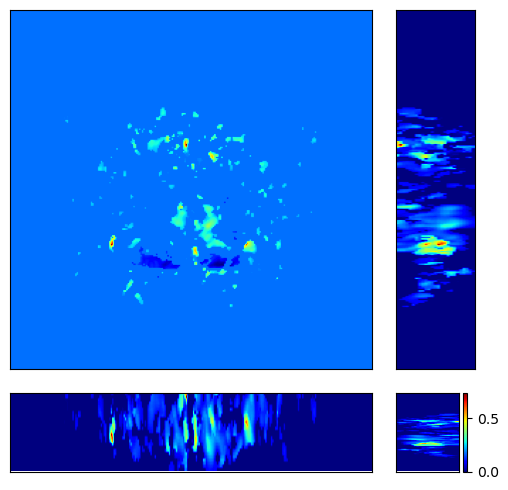

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


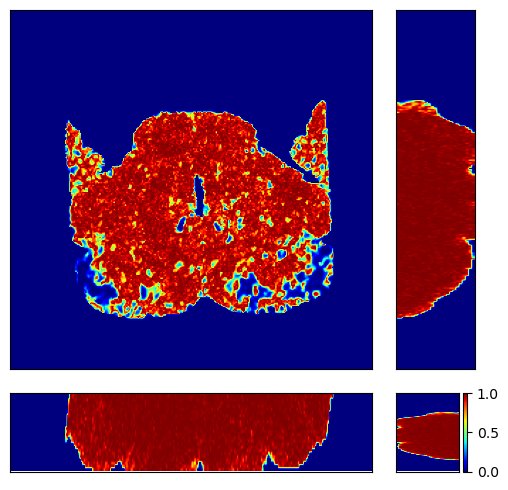

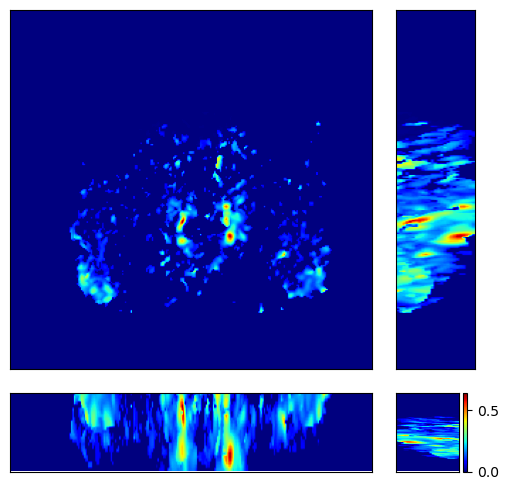

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


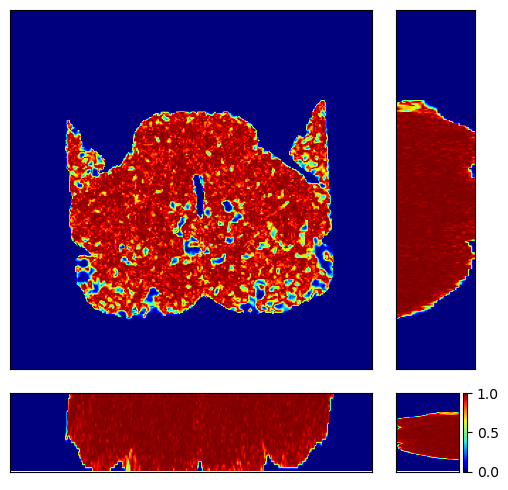

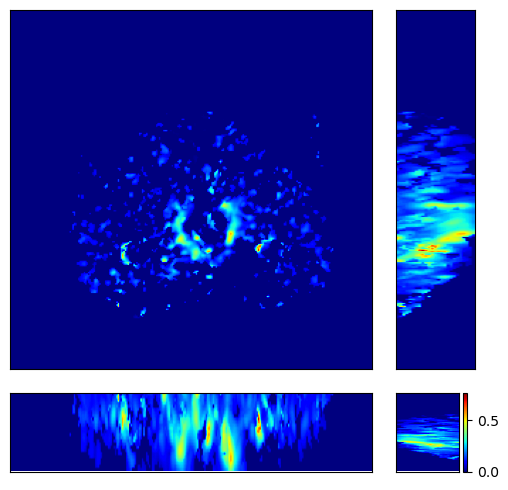

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


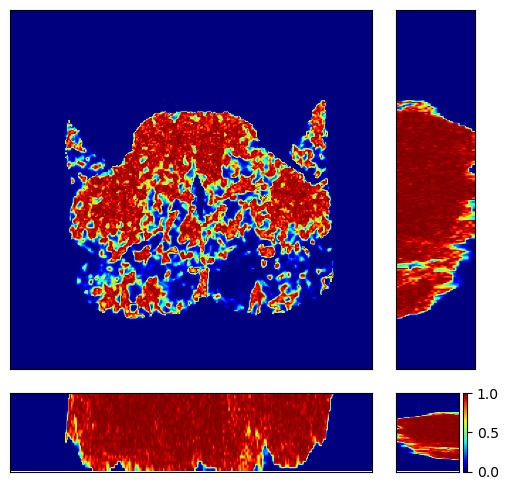

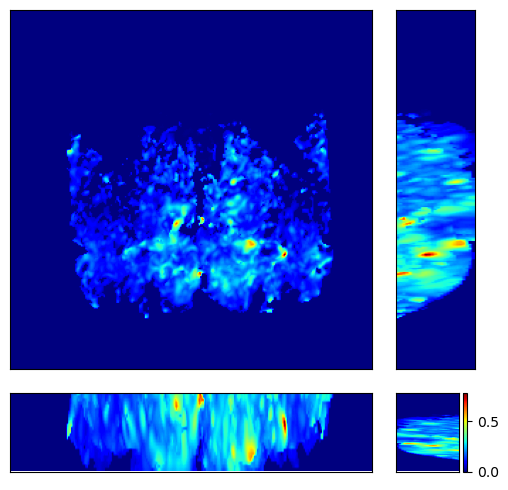

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


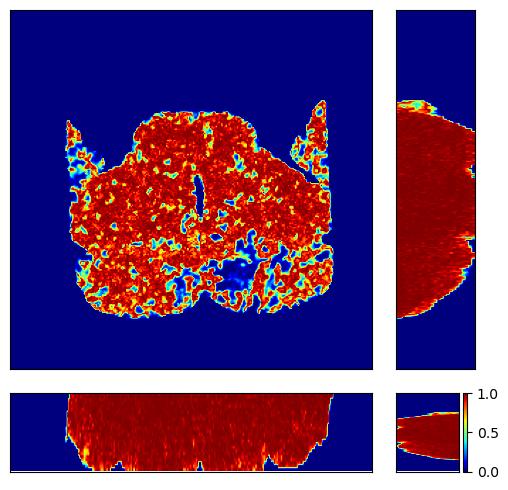

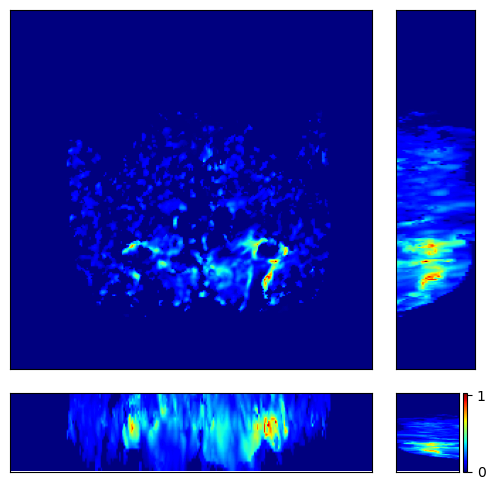

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


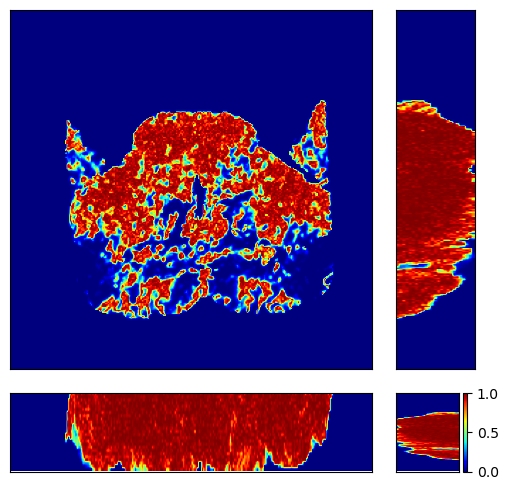

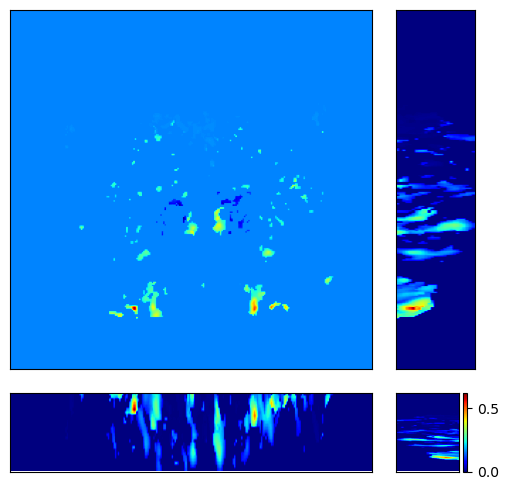

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


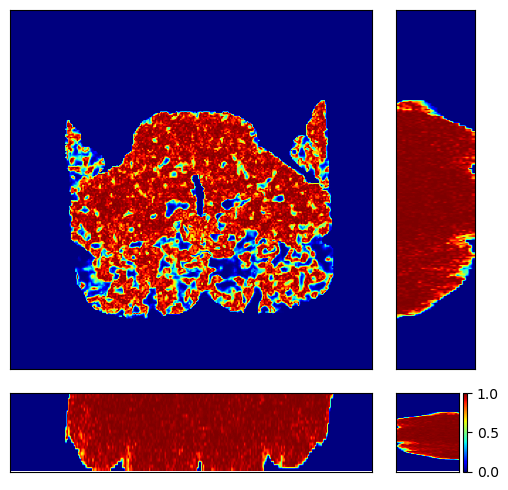

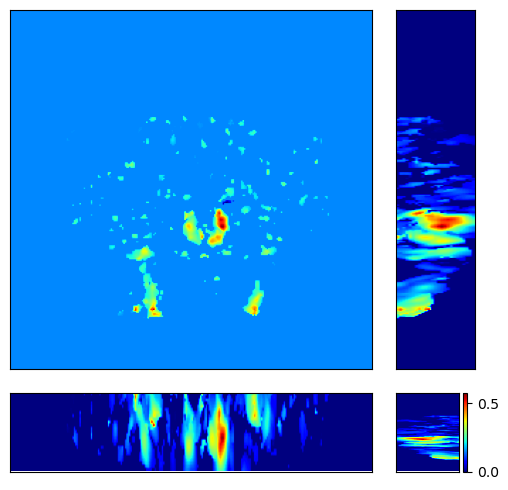

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


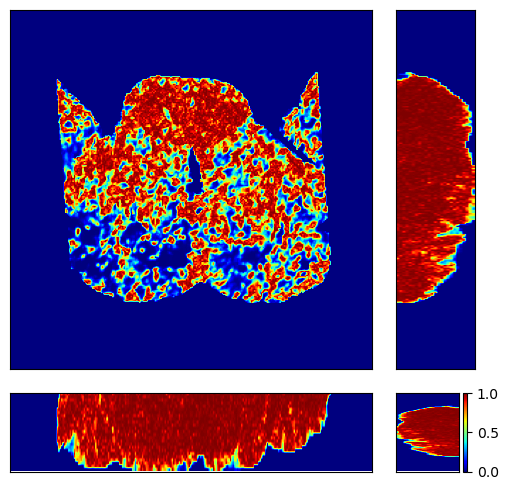

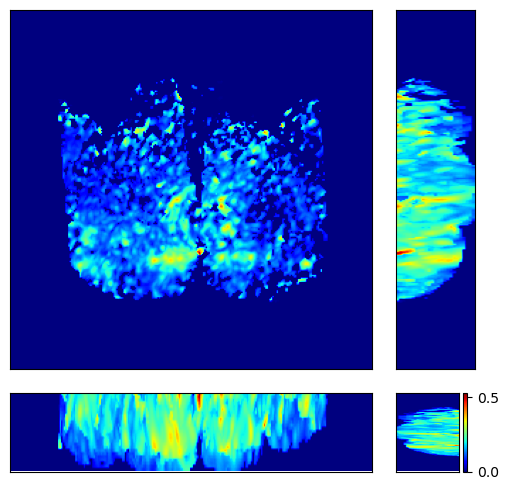

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


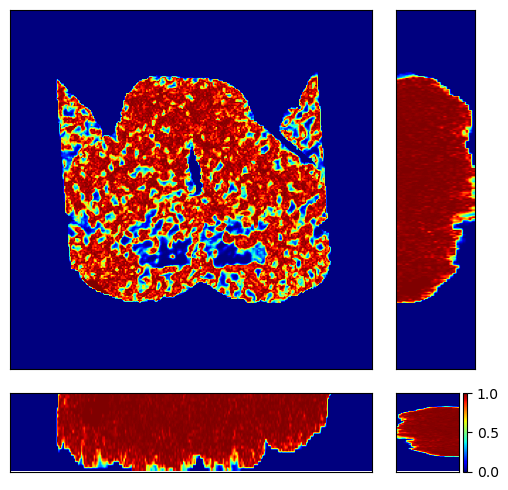

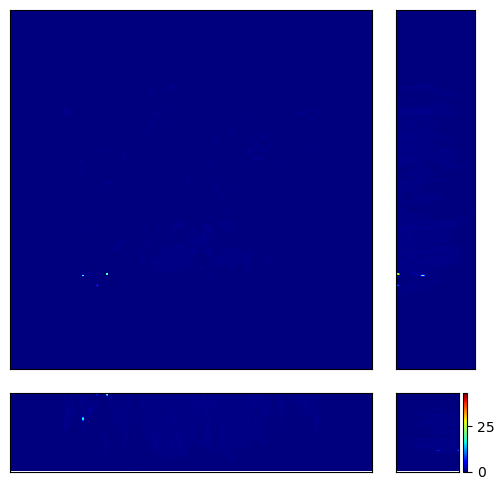

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


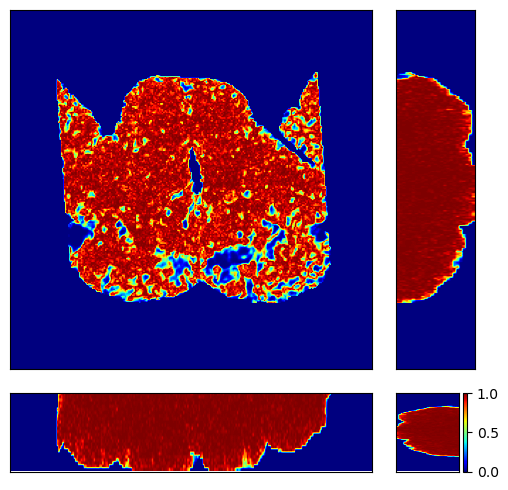

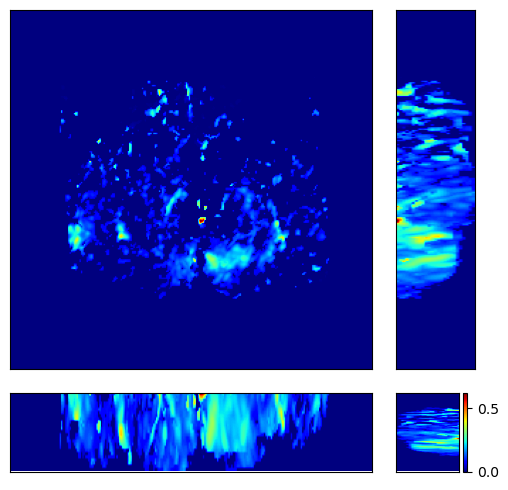

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


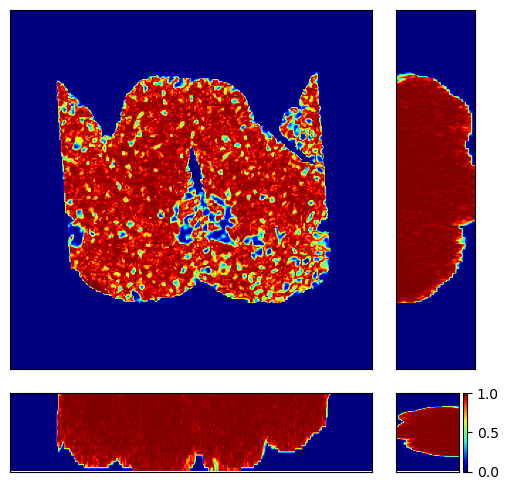

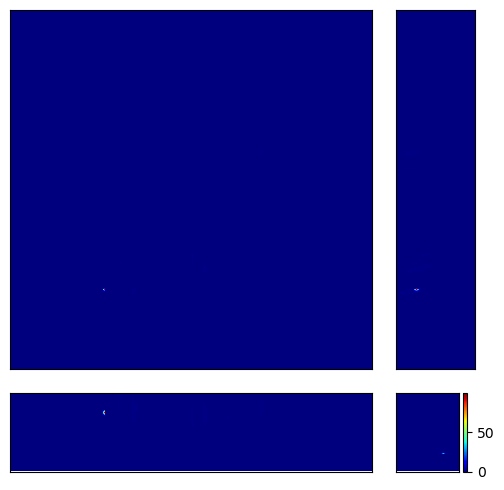

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


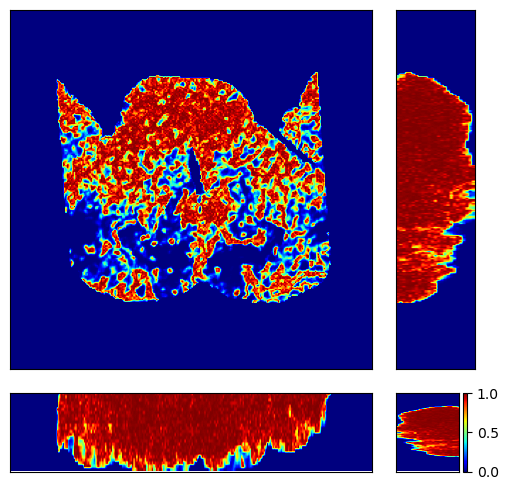

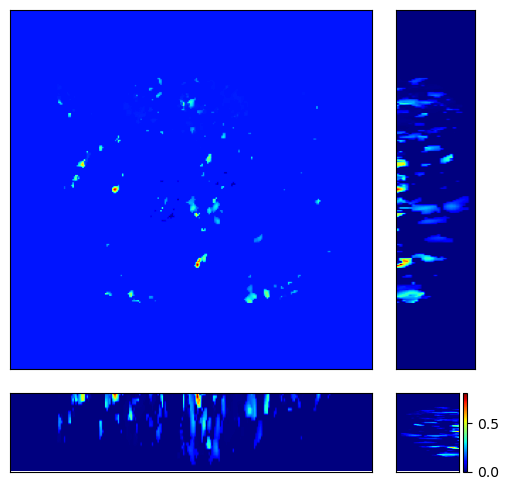

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


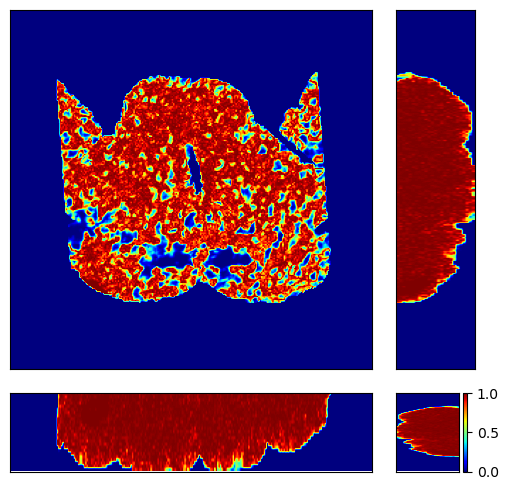

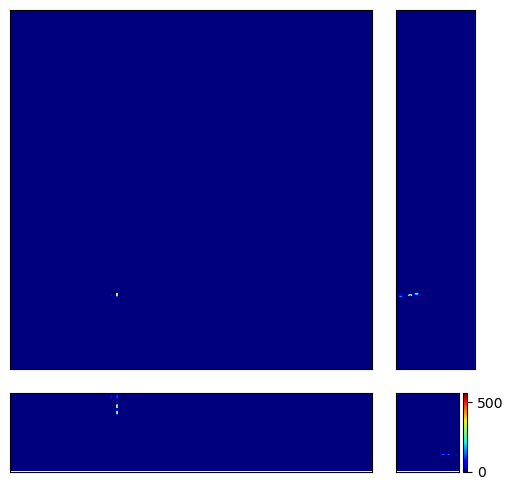

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


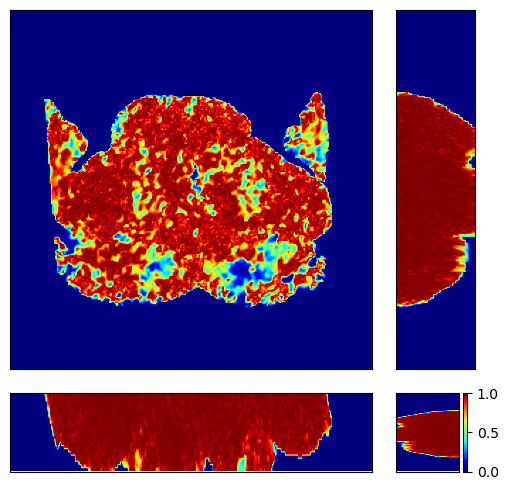

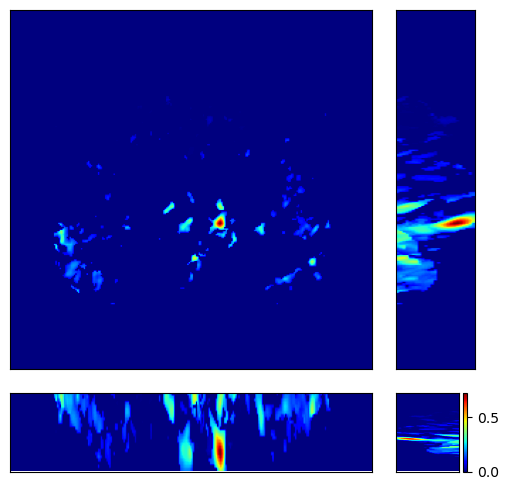

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


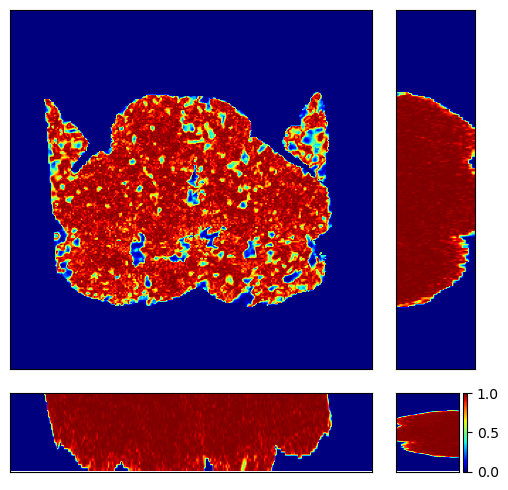

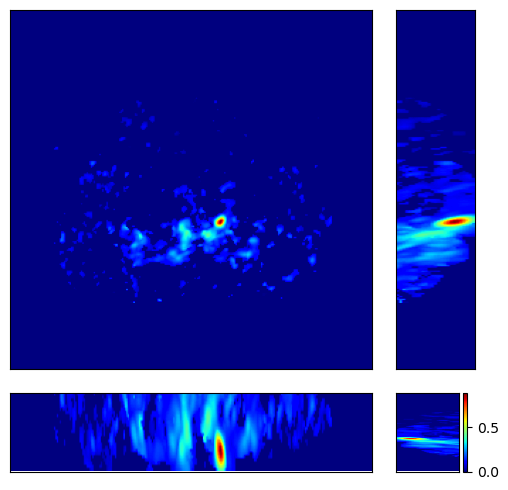

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


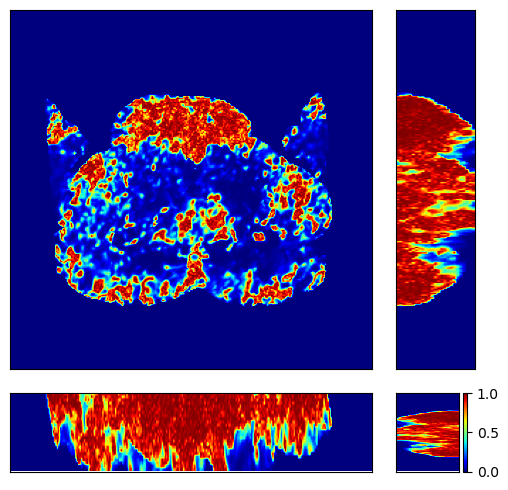

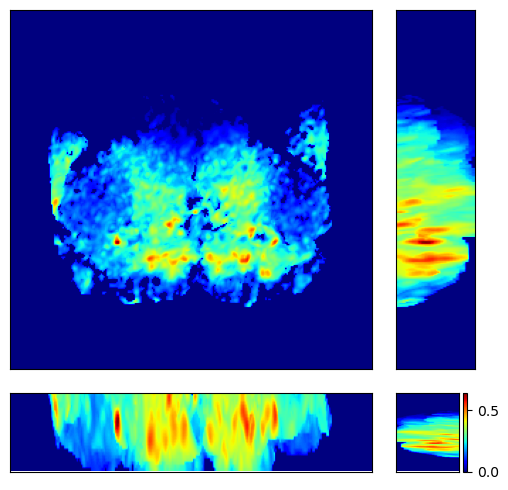

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


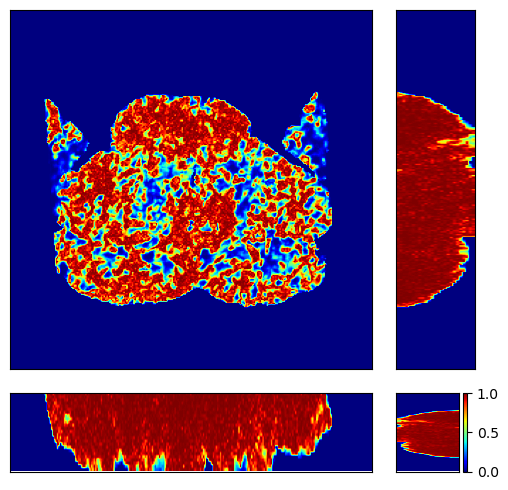

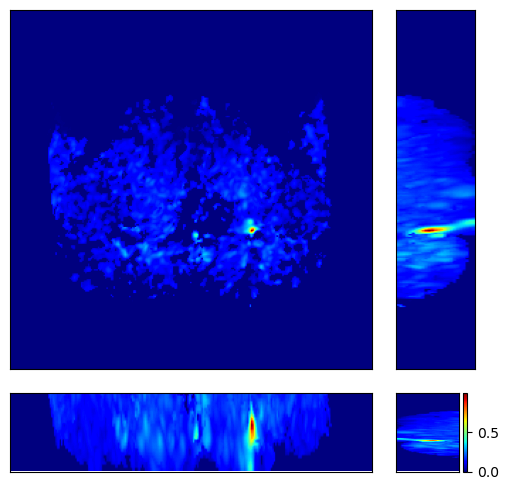

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


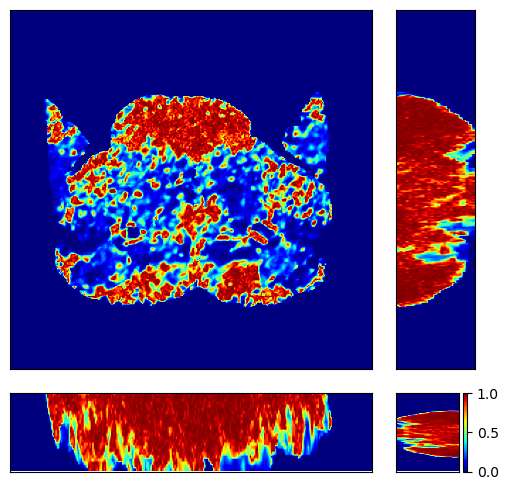

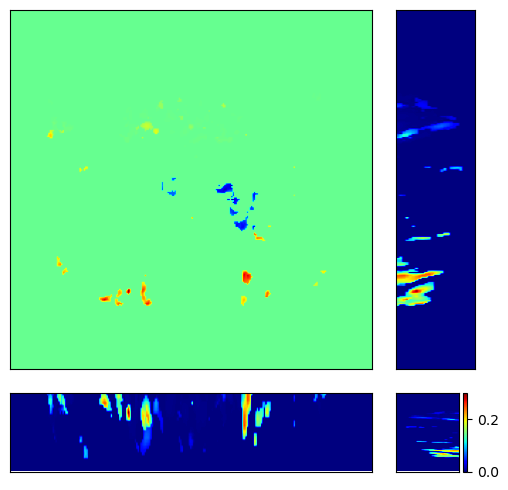

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


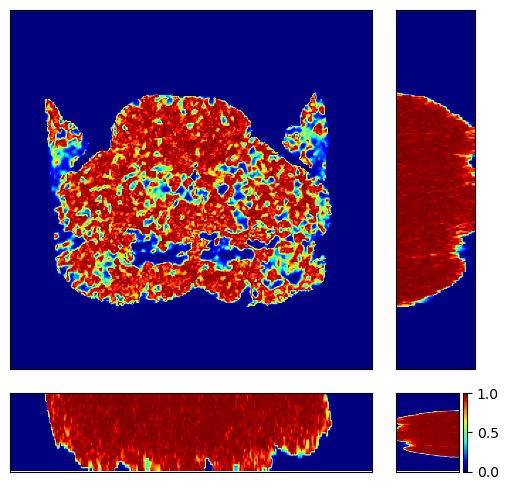

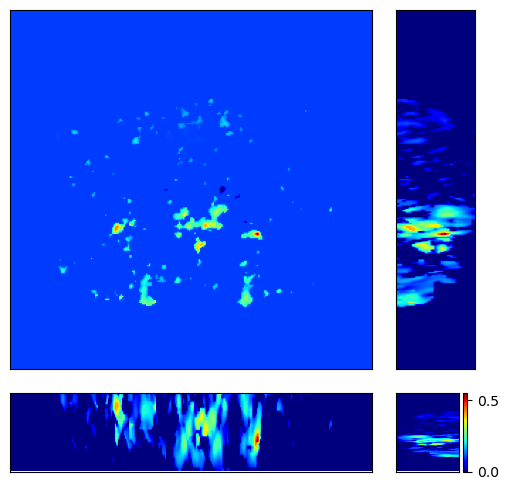

load data done! size:
(256, 256, 25, 20, 180, 2)
load atlas done! size:
(256, 256, 25)
(256, 256, 25, 180, 2)
(256, 256, 25)
(256, 256, 25)
channel 1, odor 1


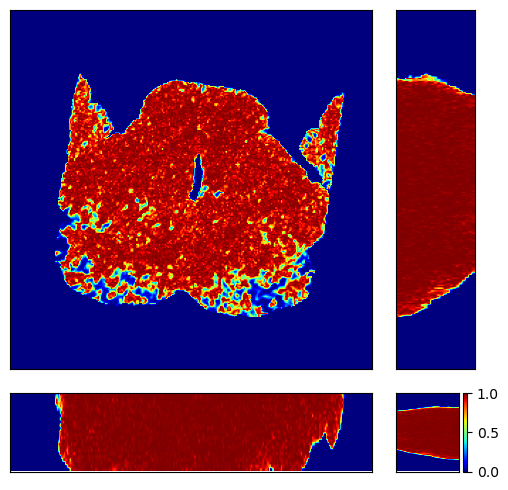

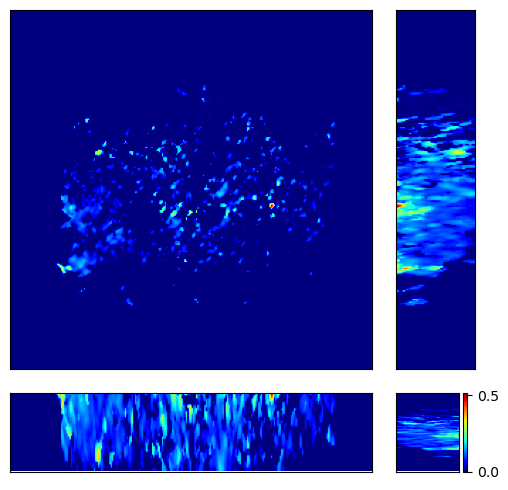

(256, 256, 25)
(256, 256, 25)
channel 2, odor 1


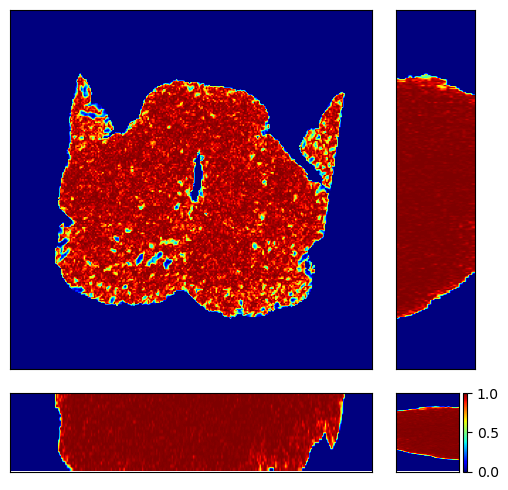

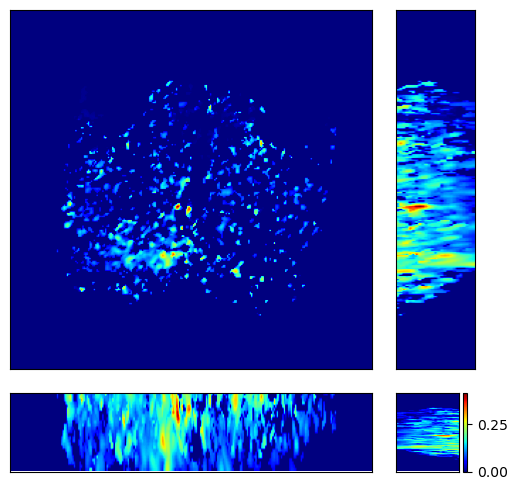

(256, 256, 25)
(256, 256, 25)
channel 1, odor 2


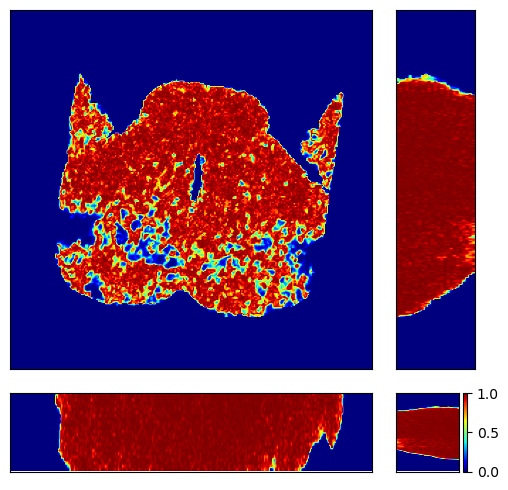

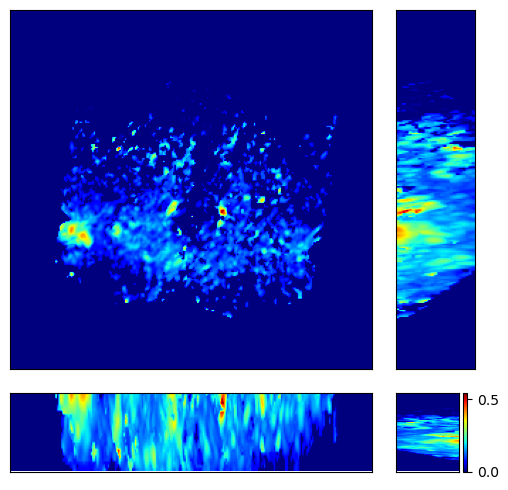

(256, 256, 25)
(256, 256, 25)
channel 2, odor 2


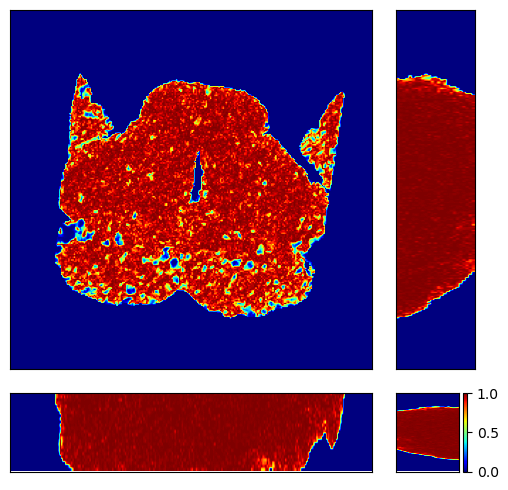

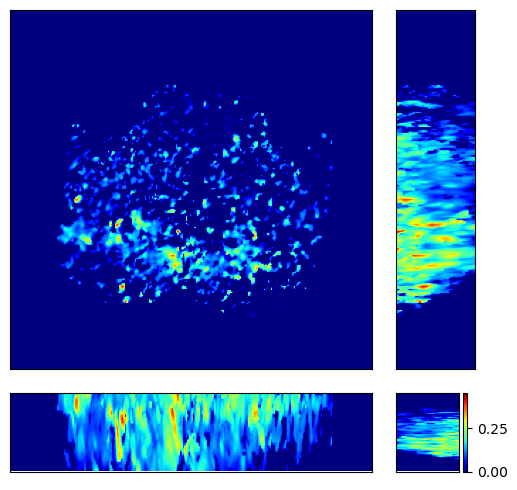

(256, 256, 25)
(256, 256, 25)
channel 1, odor 3


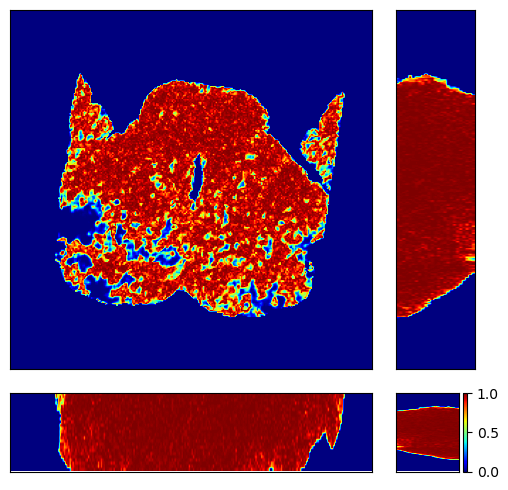

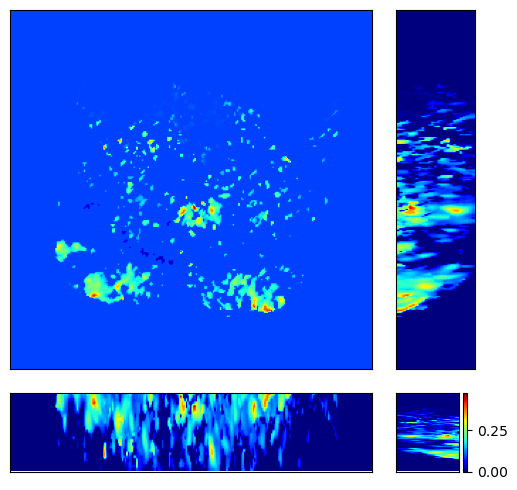

(256, 256, 25)
(256, 256, 25)
channel 2, odor 3


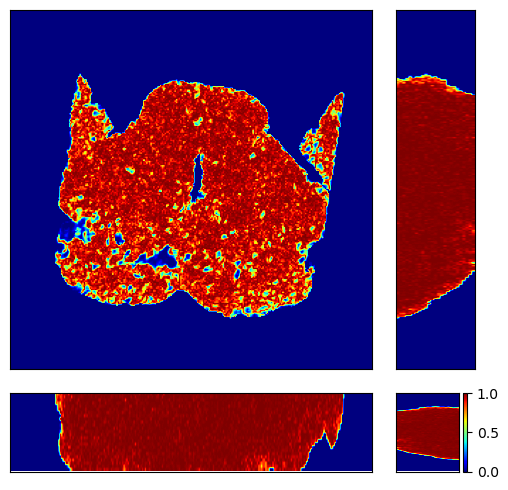

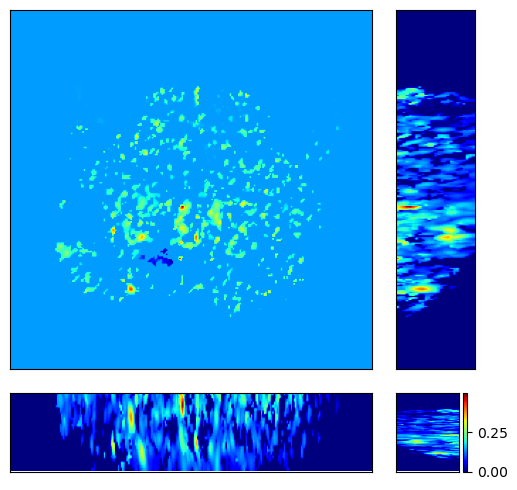

In [4]:
for fly_selected in fly_selected_list:
    # load data
    file_folder_1 = file_folder_list_1[fly_selected]
    path_file_0 = data_path + '/' + file_folder_1 + '/' + file_name[0] + '.npy'
    path_file_1 = data_path + '/' + file_folder_1 + '/' + file_name[1] + '.npy'
    data_1 = np.load(path_file_0)
    # data_1 = data_1.astype(np.float16)
    data_1 = np.transpose(data_1,[3,4,2,1,0])
    data_2 = np.load(path_file_1)
    # data_2 = data_2.astype(np.float16)
    data_2 = np.transpose(data_2,[3,4,2,1,0])
    size_x = np.size(data_1,0)
    size_y = np.size(data_1,1)
    size_z = np.size(data_1,2)
    num_tp = np.size(data_1,3)
    num_trial = np.size(data_1,4)
    data = np.concatenate((data_1,data_2),axis = 4)
    del data_1,data_2
    data = data.reshape(size_x,size_y,size_z,num_tp,num_trial,num_channel,order = 'F')
    print('load data done! size:')
    print(np.shape(data))
    # load atlas
    file_folder_2 = file_folder_1[:-5]
    atlas= tf.imread(atlas_path + '/' + file_folder_2 + '/' + atlas_name)
    atlas = np.transpose(atlas,[1,2,0])
    atlas = atlas[:,:,atlas_z_range]
    print('load atlas done! size:')
    print(np.shape(atlas))
    atlas_mask = atlas>0


    ## process
    stim_kind = np.unique(stim)
    map_response_auc = compute_auc_dff0(data)
    print(np.shape(map_response_auc))
    map_response_difference = np.zeros((size_x,size_y,size_z,len(stim_kind),num_channel))
    map_response_p = np.zeros((size_x,size_y,size_z,len(stim_kind),num_channel))
    for j in range(len(stim_kind)):
        a = np.squeeze(map_response_auc[:,:,:,stim==j+1,:])
        b = np.squeeze(map_response_auc[:,:,:,stim!=j+1,:])
        res = mannwhitneyu(a,b,axis = 3)
        p = res.pvalue
        map_response_difference[:,:,:,j,:] = np.mean(a,3)-np.mean(b,3)
        map_response_p[:,:,:,j,:] = p
        for i in range(num_channel):
            map_1 = map_response_difference[:,:,:,j,i]
            map_2 = map_response_p[:,:,:,j,i]
            map_1 = map_1*atlas_mask
            map_2 = map_2*atlas_mask
            print(np.shape(map_1))
            print(np.shape(map_2))
            print('channel '+str(i+1)+', odor '+str(j+1))
            # projection_3d(map_1,458,458,100,30,'jet',[],0,True,
            #                 ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_difference_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
            projection_3d(map_2,458,458,100,30,'jet',[],0,True,
                            ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_p_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
            the_map = map_1*(map_2<0.05)
            projection_3d(the_map,458,458,100,30,'jet',[],0,True,
                            ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_dp_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
            
    np.save(final_result_path+'/fly_'+str(fly_selected)+'_map_response_difference.npy',map_response_difference)
    np.save(final_result_path+'/fly_'+str(fly_selected)+'_map_response_p.npy',map_response_p)

In [5]:
# fly_selected = 1
# # load data
# file_folder_1 = file_folder_list_1[fly_selected]
# path_file_0 = data_path + '/' + file_folder_1 + '/' + file_name[0] + '.npy'
# path_file_1 = data_path + '/' + file_folder_1 + '/' + file_name[1] + '.npy'
# data_1 = np.load(path_file_0)
# # data_1 = data_1.astype(np.float16)
# data_1 = np.transpose(data_1,[3,4,2,1,0])
# data_2 = np.load(path_file_1)
# # data_2 = data_2.astype(np.float16)
# data_2 = np.transpose(data_2,[3,4,2,1,0])
# size_x = np.size(data_1,0)
# size_y = np.size(data_1,1)
# size_z = np.size(data_1,2)
# num_tp = np.size(data_1,3)
# num_trial = np.size(data_1,4)
# data = np.concatenate((data_1,data_2),axis = 4)
# del data_1,data_2
# data = data.reshape(size_x,size_y,size_z,num_tp,num_trial,num_channel,order = 'F')
# print('load data done! size:')
# print(np.shape(data))
# # load atlas
# file_folder_2 = file_folder_1[:-5]
# atlas= tf.imread(atlas_path + '/' + file_folder_2 + '/' + atlas_name)
# atlas = np.transpose(atlas,[1,2,0])
# atlas = atlas[:,:,atlas_z_range]
# print('load atlas done! size:')
# print(np.shape(atlas))
# atlas_mask = atlas>0


# ## process
# stim_kind = np.unique(stim)
# map_response_auc = compute_auc_dff0(data)
# print(np.shape(map_response_auc))
# map_response_difference = np.zeros((size_x,size_y,size_z,len(stim_kind),num_channel))
# map_response_p = np.zeros((size_x,size_y,size_z,len(stim_kind),num_channel))
# for j in range(len(stim_kind)):
#     a = np.squeeze(map_response_auc[:,:,:,stim==j+1,:])
#     b = np.squeeze(map_response_auc[:,:,:,stim!=j+1,:])
#     res = mannwhitneyu(a,b,axis = 3)
#     p = res.pvalue
#     map_response_difference[:,:,:,j,:] = np.mean(a,3)-np.mean(b,3)
#     map_response_p[:,:,:,j,:] = p
#     for i in range(num_channel):
#         map_1 = map_response_difference[:,:,:,j,i]
#         map_2 = map_response_p[:,:,:,j,i]
#         map_1 = map_1*atlas_mask
#         map_2 = map_2*atlas_mask
#         print(np.shape(map_1))
#         print(np.shape(map_2))
#         print('channel '+str(i+1)+', odor '+str(j+1))
#         # projection_3d(map_1,458,458,100,30,'jet',[],0,True,
#         #                 ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_difference_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
#         projection_3d(map_2,458,458,100,30,'jet',[],0,True,
#                         ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_p_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
#         the_map = map_1*(map_2<0.05)
#         projection_3d(the_map,458,458,100,30,'jet',[],0,True,
#                         ifsave,final_result_path+'/fly_'+str(fly_selected)+'_map_response_dp_channel_'+str(i+1)+'_odor_'+str(j+1)+'.png')
        
# np.save(final_result_path+'/fly_'+str(fly_selected)+'_map_response_difference.npy',map_response_difference)
# np.save(final_result_path+'/fly_'+str(fly_selected)+'_map_response_p.npy',map_response_p)
